In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde

# --- Load the dataset ---
file_path = r"C:\Users\20191165\OneDrive - TU Eindhoven\Master\Year-2\Q1\AI_fluid_mechanics\project\3MT170---Groep-3\collision_dataset_100000_H2_DSMC_sampling.csv"
# file_path = "collision_dataset_100000_H2_DSMC_sampling.csv"
# file_path = "collision_dataset_100000_H2_Etr_2000_ErA_800_ErB_1200.csv"
# file_path = "collision_dataset_100000_H2_Etr_600_ErA_400_ErB_200.csv"

# Try space-delimited first; if that fails, fall back to commas
df = pd.read_csv(file_path, sep=",")

# create test set
data = df.sample(frac=1, random_state=42).reset_index(drop=True)  # Shuffle the data
data, data_test = data.iloc[:70000], data.iloc[70000:].reset_index(drop=True)

# --- Basic info ---
print("Columns:", data.columns.tolist())
print("First few rows:")
print(data.head())

Columns: ['b', 'Etr', 'Er1', 'Er2', 'Etrp', 'Er1p', 'Er2p', 'Teq']
First few rows:
          b          Etr         Er1          Er2         Etrp        Er1p  \
0  0.042053  1592.685382  160.533045  1307.790673  1386.537360  128.841854   
1  0.497317   605.821433   56.487030   974.134069   636.023095   99.810584   
2  0.847443   309.061943  216.389502   334.260884   309.078690  198.436951   
3  1.141467   261.398550   65.673065   732.889434   294.313670   54.369180   
4  0.204248  1565.764246  155.516061    69.610367  1026.361270  631.884538   

          Er2p         Teq  
0  1545.530534  543.636792  
1   900.515140  831.424962  
2   352.114107  157.640946  
3   711.208547  490.005401  
4   132.546979  408.444094  


In [2]:
def dscatter(x,y):
    xy = np.vstack([x,y])
    z = gaussian_kde(xy)(xy)
    idx = z.argsort()
    x, y, z = x[idx], y[idx], z[idx]
    plt.scatter(x,y,c=z, s=3)


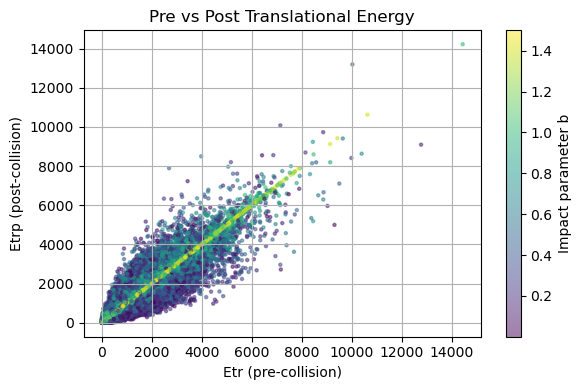

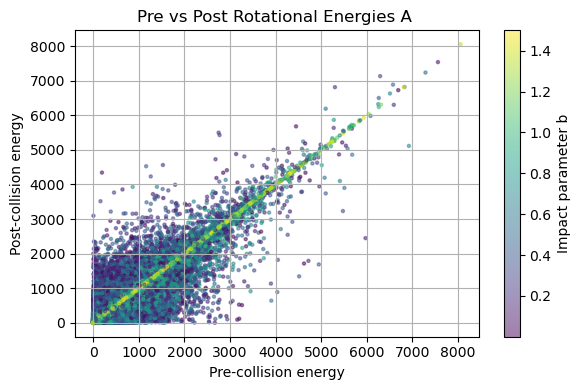

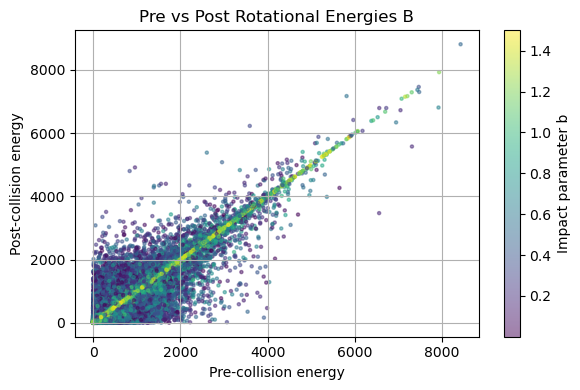

In [3]:
# --- Plot 1: Pre vs. Post Translational Energy ---
plt.figure(figsize=(6,4))
plt.scatter(data["Etr"], data["Etrp"], alpha=0.5, s=5, c=data["b"])
plt.colorbar(label='Impact parameter b')
plt.title("Pre vs Post Translational Energy")
plt.xlabel("Etr (pre-collision)")
plt.ylabel("Etrp (post-collision)")
plt.grid(True)
plt.tight_layout()
plt.show()

# --- Plot 2: Pre vs Post Rotational Energies ---
plt.figure(figsize=(6,4))
plt.scatter(data["Er1"], data["Er1p"], alpha=0.5, s=5, c=data["b"])
plt.colorbar(label='Impact parameter b')
plt.title("Pre vs Post Rotational Energies A ")
plt.xlabel("Pre-collision energy")
plt.ylabel("Post-collision energy")
plt.grid(True)
plt.tight_layout()
plt.show()

# --- Plot 3: Pre vs Post Rotational Energies ---
plt.figure(figsize=(6,4))
plt.scatter(data["Er2"], data["Er2p"], alpha=0.5, s=5, c=data["b"])
plt.colorbar(label='Impact parameter b')
plt.title("Pre vs Post Rotational Energies B")
plt.xlabel("Pre-collision energy")
plt.ylabel("Post-collision energy")
plt.grid(True)
plt.tight_layout()
plt.show()

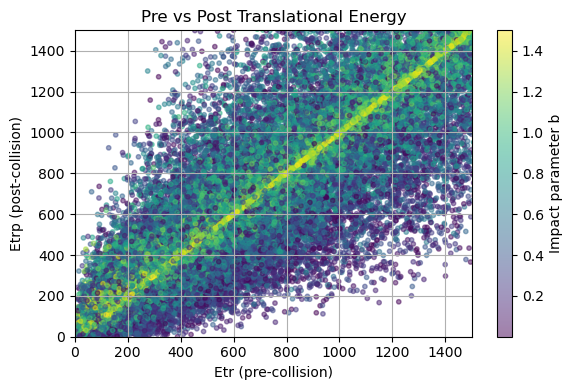

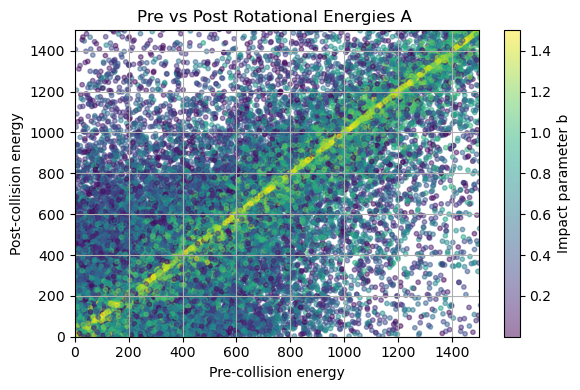

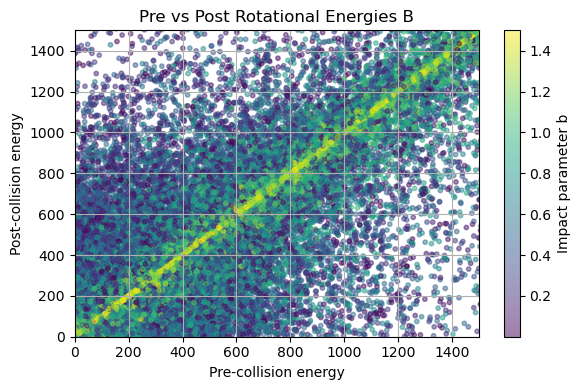

In [4]:
# --- Plot 1: Pre vs. Post Translational Energy ---
plt.figure(figsize=(6,4))
plt.scatter(data["Etr"], data["Etrp"], alpha=0.5, s=10, c=data["b"])
plt.colorbar(label='Impact parameter b')
plt.title("Pre vs Post Translational Energy")
plt.xlabel("Etr (pre-collision)")
plt.ylabel("Etrp (post-collision)")
plt.grid(True)
plt.tight_layout()
plt.xlim(0, 1500)
plt.ylim(0, 1500)
plt.show()

# --- Plot 2: Pre vs Post Rotational Energies ---
plt.figure(figsize=(6,4))
plt.scatter(data["Er1"], data["Er1p"], alpha=0.5, s=10, c=data["b"])
plt.colorbar(label='Impact parameter b')
plt.title("Pre vs Post Rotational Energies A ")
plt.xlabel("Pre-collision energy")
plt.ylabel("Post-collision energy")
plt.grid(True)
plt.tight_layout()
plt.xlim(0, 1500)
plt.ylim(0, 1500)
plt.show()

# --- Plot 3: Pre vs Post Rotational Energies ---
plt.figure(figsize=(6,4))
plt.scatter(data["Er2"], data["Er2p"], alpha=0.5, s=10, c=data["b"])
plt.colorbar(label='Impact parameter b')
plt.title("Pre vs Post Rotational Energies B")
plt.xlabel("Pre-collision energy")
plt.ylabel("Post-collision energy")
plt.grid(True)
plt.tight_layout()
plt.xlim(0, 1500)
plt.ylim(0, 1500)
plt.show()

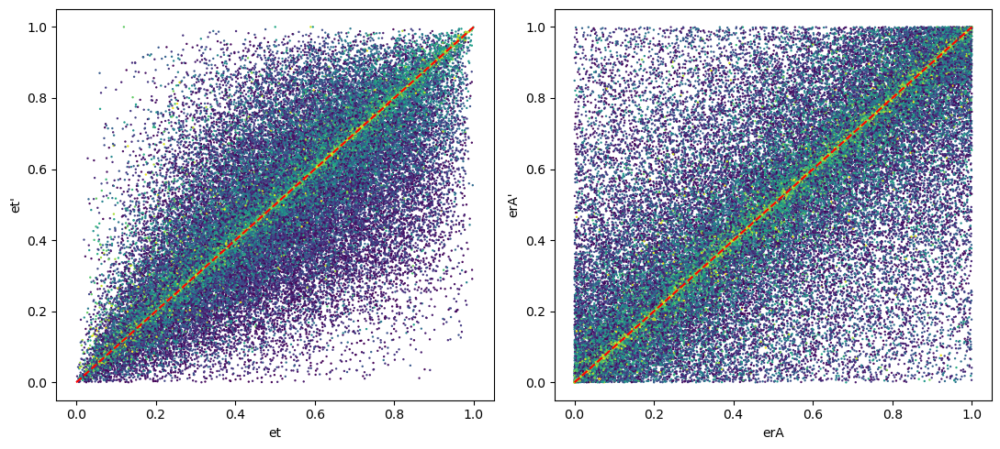

In [5]:
import os
import math
import numpy as np
import pandas as pd
import jax
import jax.numpy as jnp
from jax import random, jit, value_and_grad
from jax.example_libraries import stax, optimizers
import matplotlib.pyplot as plt

# -------------------------- Utilities --------------------------
def logit(x):
    x = jnp.clip(x, 1e-6, 1 - 1e-6)
    return jnp.log(x) - jnp.log1p(-x)

def inv_logit(z):
    return jnp.clip(1.0 / (1.0 + jnp.exp(-z)), 1e-12, 1 - 1e-12)

def preprocess_df(df):
    """
    Preprocess according to the paper's variable definitions:
    - Ec: total collision energy
    - eps_t: translational energy fraction  
    - eps_r_A: rotational energy fraction for molecule A
    """
    # Epsilon to prevent division by zero if total rotational energy is zero
    epsilon = 1e-12

    # --- Pre-collision values ---
    Etr = df["Etr"].values
    Er1 = df["Er1"].values
    Er2 = df["Er2"].values
    
    Ec = Etr + Er1 + Er2
    E_rot_total = Er1 + Er2
    
    # Calculate energy fractions (precollisional)
    eps_t = Etr / (Ec + epsilon)
    eps_r_A = Er1 / (E_rot_total + epsilon)
    
    # --- Post-collision values (for training targets) ---
    Etrp = df["Etrp"].values
    Er1p = df["Er1p"].values
    Er2p = df["Er2p"].values
    
    # Post-collision Ec is the same as pre-collision Ec
    E_rot_p_total = Er1p + Er2p

    # Calculate postcollisional energy fractions (targets)
    eps_t_prime = Etrp / (Ec + epsilon)
    eps_r_A_prime = Er1p / (E_rot_p_total + epsilon)
    
    # Apply transformations as per Equation 4.15
    x = np.stack([
        np.log(Ec + epsilon),      # E_c^(p)
        logit(eps_t),              # eps_t^(p) 
        logit(eps_r_A),            # eps_r,A^(p)
        np.exp(df["b"].values),     # b^(p)  # Uncomment if including impact parameter
        #df["Teq"].values
    ], axis=-1)
    
    y = np.stack([
        logit(eps_t_prime),        # eps_t'^(p)
        logit(eps_r_A_prime)       # eps_r,A'^(p)
    ], axis=-1)
    
    return x.astype(np.float32), y.astype(np.float32), Ec

# -------------------------- Load and split dataset --------------------------
X, Y, Ec = preprocess_df(data)
X_test, Y_test, Ec_test = preprocess_df(data_test)
N = X.shape[0]


X_train, Y_train = X, Y
X_val, Y_val = X_test, Y_test
X_test, Y_test = X_test, Y_test

plt.figure(figsize=[11,5])

plt.subplot(1,2,1)
plt.xlabel("et")
plt.ylabel("et'")
plt.scatter(inv_logit(X_train[:, 1]), inv_logit(Y_train[:, 0]), s=0.5, alpha=1, c=X_train[:, 3], cmap='viridis')
plt.plot([0,1], [0, 1], color='red', linestyle='--')

plt.subplot(1,2,2)
plt.xlabel("erA")
plt.ylabel("erA'")
plt.scatter(inv_logit(X_train[:, 2]), inv_logit(Y_train[:, 1]), s=0.5, alpha=1, c=X_train[:, 3], cmap='viridis')
plt.plot([0,1], [0, 1], color='red', linestyle='--')
plt.tight_layout()
plt.show()

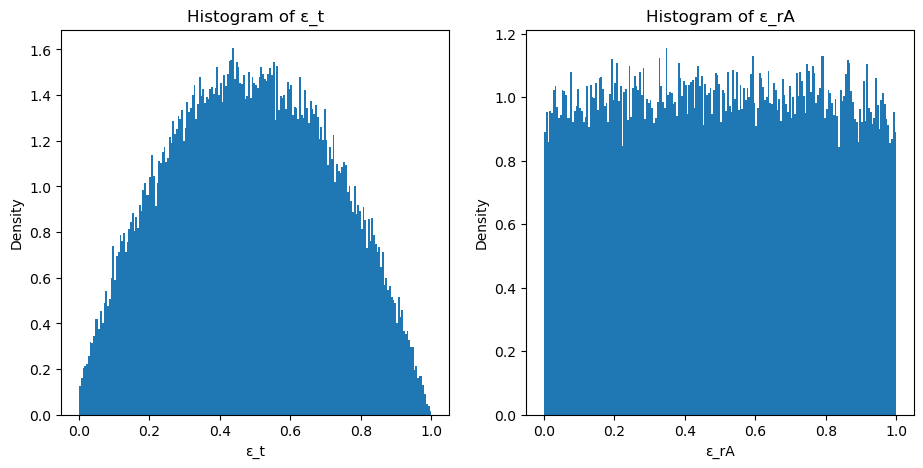

In [6]:
plt.figure(figsize=[11,5])

plt.subplot(1,2,1)
plt.hist(inv_logit(Y_train[:, 0]), bins=200, density=True)
plt.xlabel("ε_t")
plt.ylabel("Density")
plt.title("Histogram of ε_t")

plt.subplot(1,2,2)
plt.hist(inv_logit(Y_train[:, 1]), bins=200, density=True)
plt.xlabel("ε_rA")
plt.ylabel("Density")
plt.title("Histogram of ε_rA")
plt.show()

# symmetric GMM

In [7]:
import jax
import jax.numpy as jnp
from jax.scipy.stats import norm, multivariate_normal
import matplotlib.pyplot as plt
from tqdm.notebook import trange # For a nice progress bar


class SymmetricGMM:
    """
    A Gaussian Mixture Model symmetric around the x=y line, trainable with EM.
    """
    def __init__(self):
        """Initializes the model. Parameters will be set after fitting."""
        self.weights = None
        self.means = None
        self.covariances = None
        self.n_base_components = None
        self.n_components = None
        self.converged_ = False
        self.log_likelihood_history_ = []

    def fit(self, X, n_base_components, n_iterations=100, tol=1e-4, reg_covar=1e-6, key=jax.random.PRNGKey(0)):
        """
        Fits the GMM to the data using a symmetric Expectation-Maximization algorithm.

        Args:
            X (jnp.ndarray): The training data, shape (n_samples, 2).
            n_base_components (int): The number of symmetric modes (K). The total
                                     number of components will be 2*K.
            n_iterations (int): The maximum number of EM iterations.
            tol (float): The convergence threshold for the log-likelihood.
            reg_covar (float): A small value added to the diagonal of covariances
                               to ensure they are non-singular.
            key (jax.random.PRNGKey): JAX random key for initialization.

        Returns:
            self: The fitted model instance.
        """
        self.n_base_components = n_base_components
        n_samples = X.shape[0]

        # 1. Initialize base parameters
        key, subkey = jax.random.split(key)
        base_weights, base_means, base_covariances = self._initialize_params(X, subkey)

        prev_log_likelihood = -jnp.inf
        
        pbar = trange(n_iterations, desc="EM Iterations")
        for i in pbar:
            # Create full symmetric parameters from base
            self.weights, self.means, self.covariances = self._create_symmetric_params(
                base_weights, base_means, base_covariances
            )
            self.n_components = len(self.weights)

            # 2. E-Step: Calculate responsibilities and log-likelihood
            log_responsibilities, log_likelihood = self._e_step(X)
            responsibilities = jnp.exp(log_responsibilities)
            self.log_likelihood_history_.append(log_likelihood)

            # 3. M-Step: Update base parameters using symmetric update rules
            base_weights, base_means, base_covariances = self._m_step(X, responsibilities, reg_covar)
            
            # Check for convergence
            change = log_likelihood - prev_log_likelihood
            pbar.set_postfix({"Log-Likelihood": f"{log_likelihood:.4f}", "Change": f"{change:.4f}"})
            if jnp.abs(change) < tol:
                self.converged_ = True
                pbar.close()
                print(f"Converged after {i+1} iterations.")
                break
            prev_log_likelihood = log_likelihood

        if not self.converged_:
            print("EM algorithm did not converge within the specified number of iterations.")

        return self

    def _initialize_params(self, X, key):
        """Initializes the K base parameters."""
        n_samples = X.shape[0]
        
        # Initialize means by randomly picking K points from the data
        initial_means = jax.random.choice(key, X, shape=(self.n_base_components,), replace=False)
        
        # Initialize weights uniformly
        initial_weights = jnp.full(self.n_base_components, 1.0 / (2 * self.n_base_components))
        
        # Initialize covariances as identity matrices
        initial_covs = jnp.repeat(jnp.eye(2)[None, :, :], self.n_base_components, axis=0)
        
        return initial_weights, initial_means, initial_covs

    def _create_symmetric_params(self, weights, means, covs):
        """Constructs the full set of symmetric parameters."""
        flipped_means = jnp.fliplr(means)
        flipped_covs = covs.at[:, [0, 1], [0, 1]].set(covs[:, [1, 0], [1, 0]])
        full_weights = jnp.concatenate([weights, weights])
        full_means = jnp.concatenate([means, flipped_means], axis=0)
        full_covariances = jnp.concatenate([covs, flipped_covs], axis=0)
        return full_weights, full_means, full_covariances

    def _create_symmetric_params(self, weights, means, covs):
        """Constructs the full set of point-symmetric parameters around the origin."""
        # Reflect means through the origin
        flipped_means = -means

        # Covariances are unchanged under point symmetry
        flipped_covs = covs

        # Duplicate weights for symmetric counterparts
        full_weights = jnp.concatenate([weights, weights])
        full_means = jnp.concatenate([means, flipped_means], axis=0)
        full_covariances = jnp.concatenate([covs, flipped_covs], axis=0)

        return full_weights, full_means, full_covariances
        

    def _e_step(self, X):
        """Performs the E-step of the algorithm."""
        log_prob_norm = jax.vmap(
            lambda mu, cov: multivariate_normal.logpdf(X, mu, cov)
        )(self.means, self.covariances).T
        
        weighted_log_prob = log_prob_norm + jnp.log(self.weights)
        log_prob_total = jax.scipy.special.logsumexp(weighted_log_prob, axis=1)
        log_responsibilities = weighted_log_prob - log_prob_total[:, None]
        
        return log_responsibilities, jnp.sum(log_prob_total)

    def _m_step(self, X, responsibilities, reg_covar):
        """Performs the symmetric M-step of the algorithm."""
        n_samples = X.shape[0]
        K = self.n_base_components
        
        # Split responsibilities for base and flipped components
        r_base = responsibilities[:, :K]
        r_flipped = responsibilities[:, K:]
        
        # Sum of responsibilities for each pair
        R_pair = r_base.sum(axis=0) + r_flipped.sum(axis=0)

        # Update base weights
        new_base_weights = R_pair / (2 * n_samples)
        
        # Update base means
        X_flipped = jnp.fliplr(X)
        num_means = jnp.dot(r_base.T, X) + jnp.dot(r_flipped.T, X_flipped)
        new_base_means = num_means / (R_pair[:, None] + 1e-6)
        
        # Update base covariances (vectorized)
        def update_cov_k(k):
            diff_base = X - new_base_means[k]
            diff_flipped = X_flipped - new_base_means[k]
            num_cov_base = jnp.dot(diff_base.T * r_base[:, k], diff_base)
            num_cov_flipped = jnp.dot(diff_flipped.T * r_flipped[:, k], diff_flipped)
            cov_k = (num_cov_base + num_cov_flipped) / (R_pair[k] + 1e-6)
            # Add regularization
            cov_k += jnp.eye(2) * reg_covar
            return cov_k
            
        new_base_covariances = jax.vmap(update_cov_k)(jnp.arange(K))
        
        return new_base_weights, new_base_means, new_base_covariances
        
    def sample(self, key, n_samples):
        """Samples from the joint distribution p(x, y)."""
        key_choice, key_sample = jax.random.split(key)
        component_indices = jax.random.choice(key_choice, self.n_components, (n_samples,), p=self.weights)
        samples = jax.vmap(lambda k, s_key: jax.random.multivariate_normal(s_key, self.means[k], self.covariances[k]))(
            component_indices, jax.random.split(key_sample, n_samples)
        )
        return samples
    
    def conditional_sample(self, key, x_values):
        """
        Samples from the conditional distribution p(y|x) for given x values.

        Args:
            key (jax.random.PRNGKey): JAX random key.
            x_values (jnp.ndarray): A 1D array of x-values to condition on.

        Returns:
            jnp.ndarray: A 1D array of sampled y-values, one for each x_value.
        """
        # We use vmap to efficiently sample a y for each x
        # Create a unique key for each x value
        keys = jax.random.split(key, num=x_values.shape[0])

        # jit-compile the vmapped function for performance
        return jax.jit(jax.vmap(self._sample_single_y))(keys, x_values)

    def _sample_single_y(self, key, x_val):
        """Helper function to sample one y value for a single x value."""
        # 1. Calculate the responsibility of each component for the given x_val
        # p(k|x) ∝ p(x|k) * p(k)
        # We work in log-space for numerical stability

        # p(x|k) is the PDF of a 1D Gaussian (the marginal of the 2D Gaussian)
        mus_x = self.means[:, 0]
        vars_x = self.covariances[:, 0, 0]
        log_p_x_given_k = norm.logpdf(x_val, mus_x, jnp.sqrt(vars_x))

        # p(k) is the component weight
        log_p_k = jnp.log(self.weights)

        # Log of unnormalized responsibilities
        log_responsibilities = log_p_x_given_k + log_p_k

        # 2. Choose a component k based on these responsibilities
        key_choice, key_sample = jax.random.split(key)
        chosen_k = jax.random.categorical(key_choice, log_responsibilities)

        # 3. Sample y from the conditional distribution p(y|x, k) of the chosen component
        # For a multivariate normal, this conditional is also a normal distribution.
        mu_k = self.means[chosen_k]
        cov_k = self.covariances[chosen_k]

        # Parameters of the conditional Gaussian N(mu_y_cond, var_y_cond)
        # Using the standard formula for conditional Gaussians
        mu_y_cond = mu_k[1] + cov_k[1, 0] / (cov_k[0, 0] + 1e-6) * (x_val - mu_k[0])
        var_y_cond = cov_k[1, 1] - cov_k[1, 0] * cov_k[0, 1] / (cov_k[0, 0] + 1e-6)

        # Sample from this 1D Gaussian
        y_sample = mu_y_cond + jax.random.normal(key_sample) * jnp.sqrt(jnp.maximum(0, var_y_cond))

        return y_sample

EM Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

EM algorithm did not converge within the specified number of iterations.


EM Iterations:   0%|          | 0/20 [00:00<?, ?it/s]

EM algorithm did not converge within the specified number of iterations.


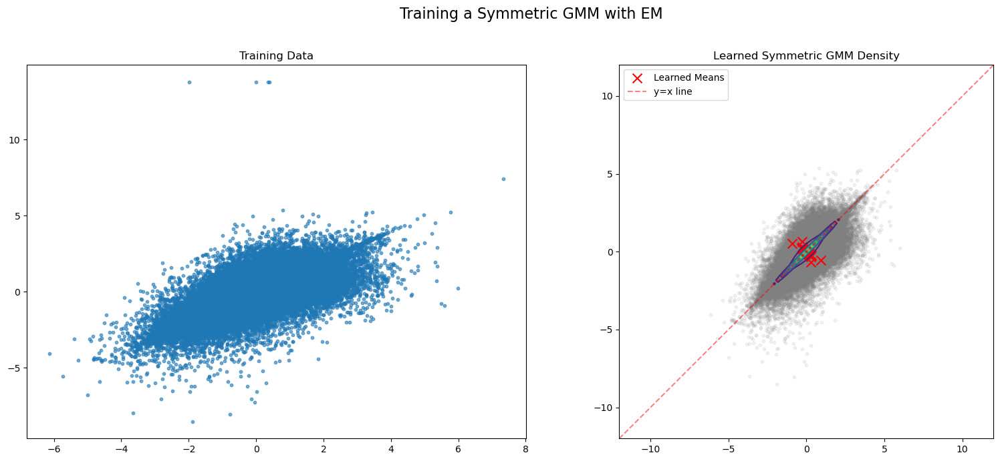

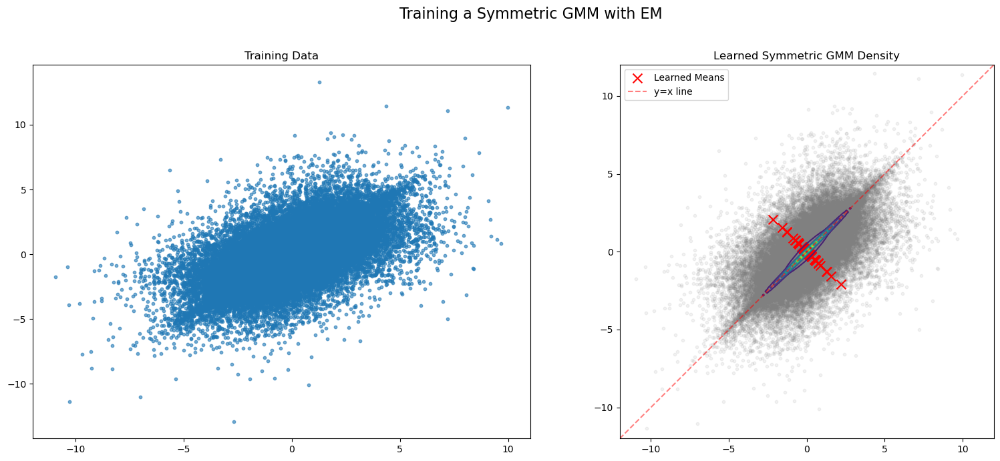

In [8]:
# 1. Generate synthetic data from a known symmetric GMM
key = jax.random.PRNGKey(42)

# 2. Train a new SymmetricGMM on this data
gmm_eps_t = SymmetricGMM()
gmm_eps_rA = SymmetricGMM()
key, subkey = jax.random.split(key)

data_eps_t = jnp.vstack([X_train[:, 1], Y_train[:, 0]]).T
data_eps_rA = jnp.vstack([X_train[:, 2], Y_train[:, 1]]).T

# The user specifies the number of BASE modes they want to find
gmm_eps_t.fit(data_eps_t, n_base_components=40, n_iterations=20, key=subkey)
gmm_eps_rA.fit(data_eps_rA, n_base_components=40, n_iterations=20, key=subkey)

# 3. Visualize the results
fig = plt.figure(figsize=(16, 7))

# Plot training data
ax1 = fig.add_subplot(1, 2, 1)
ax1.set_title("Training Data")
ax1.scatter(data_eps_t[:, 0], data_eps_t[:, 1], s=10, alpha=0.6)

# Plot learned distribution
ax2 = fig.add_subplot(1, 2, 2)
ax2.set_title("Learned Symmetric GMM Density")
ax2.scatter(data_eps_t[:, 0], data_eps_t[:, 1], s=10, alpha=0.1, color='gray') # Show data in background

# Create a grid for contour plot
x = jnp.linspace(-12, 12, 100)
y = jnp.linspace(-12, 12, 100)
X, Y = jnp.meshgrid(x, y)
grid_points = jnp.dstack((X, Y)).reshape(-1, 2)

# Calculate probability density on the grid
log_probs = jax.vmap(
    lambda mu, cov, w: jnp.log(w) + multivariate_normal.logpdf(grid_points, mu, cov)
)(gmm_eps_t.means, gmm_eps_t.covariances, gmm_eps_t.weights)

total_log_prob = jax.scipy.special.logsumexp(log_probs, axis=0)
Z = jnp.exp(total_log_prob).reshape(100, 100)

# Plot contours and means
ax2.contour(X, Y, Z, levels=10, cmap='viridis')
ax2.scatter(gmm_eps_t.means[:, 0], gmm_eps_t.means[:, 1], marker='x', color='red', s=100, label='Learned Means')
ax2.plot([-12, 12], [-12, 12], 'r--', label='y=x line', alpha=0.5)

ax2.set_aspect('equal', adjustable='box')
ax2.set_xlim(-12, 12)
ax2.set_ylim(-12, 12)
ax2.legend()

plt.suptitle("Training a Symmetric GMM with EM", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# 3. Visualize the results
fig = plt.figure(figsize=(16, 7))

# Plot training data
ax1 = fig.add_subplot(1, 2, 1)
ax1.set_title("Training Data")
ax1.scatter(data_eps_rA[:, 0], data_eps_rA[:, 1], s=10, alpha=0.6)

# Plot learned distribution
ax2 = fig.add_subplot(1, 2, 2)
ax2.set_title("Learned Symmetric GMM Density")
ax2.scatter(data_eps_rA[:, 0], data_eps_rA[:, 1], s=10, alpha=0.1, color='gray') # Show data in background

# Create a grid for contour plot
x = jnp.linspace(-12, 12, 100)
y = jnp.linspace(-12, 12, 100)
X, Y = jnp.meshgrid(x, y)
grid_points = jnp.dstack((X, Y)).reshape(-1, 2)

# Calculate probability density on the grid
log_probs = jax.vmap(
    lambda mu, cov, w: jnp.log(w) + multivariate_normal.logpdf(grid_points, mu, cov)
)(gmm_eps_rA.means, gmm_eps_rA.covariances, gmm_eps_rA.weights)

total_log_prob = jax.scipy.special.logsumexp(log_probs, axis=0)
Z = jnp.exp(total_log_prob).reshape(100, 100)

# Plot contours and means
ax2.contour(X, Y, Z, levels=10, cmap='viridis')
ax2.scatter(gmm_eps_rA.means[:, 0], gmm_eps_rA.means[:, 1], marker='x', color='red', s=100, label='Learned Means')
ax2.plot([-12, 12], [-12, 12], 'r--', label='y=x line', alpha=0.5)

ax2.set_aspect('equal', adjustable='box')
ax2.set_xlim(-12, 12)
ax2.set_ylim(-12, 12)
ax2.legend()

plt.suptitle("Training a Symmetric GMM with EM", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

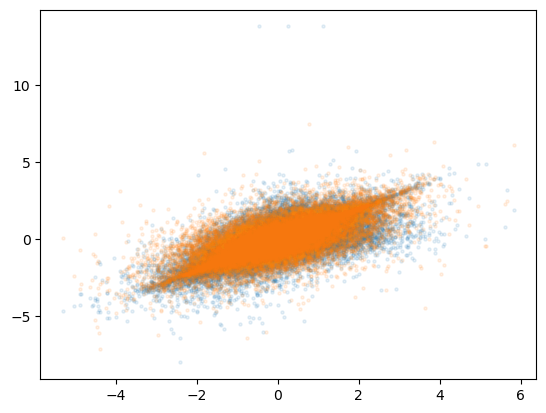

In [9]:
y_test_sample_t = gmm_eps_t.conditional_sample(key, X_test[:, 1])

plt.scatter(X_test[:, 1], Y_test[:, 0], s=5, alpha=0.1, label='True Data')
plt.scatter(X_test[:, 1], y_test_sample_t, s=5, alpha=0.1, label='True Data')

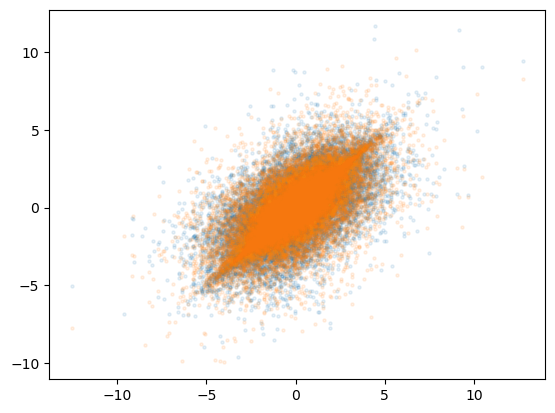

In [10]:
y_test_sample_rA = gmm_eps_rA.conditional_sample(key, X_test[:, 2])

plt.scatter(X_test[:, 2], Y_test[:, 1], s=5, alpha=0.1, label='True Data')
plt.scatter(X_test[:, 2], y_test_sample_rA, s=5, alpha=0.1, label='True Data')

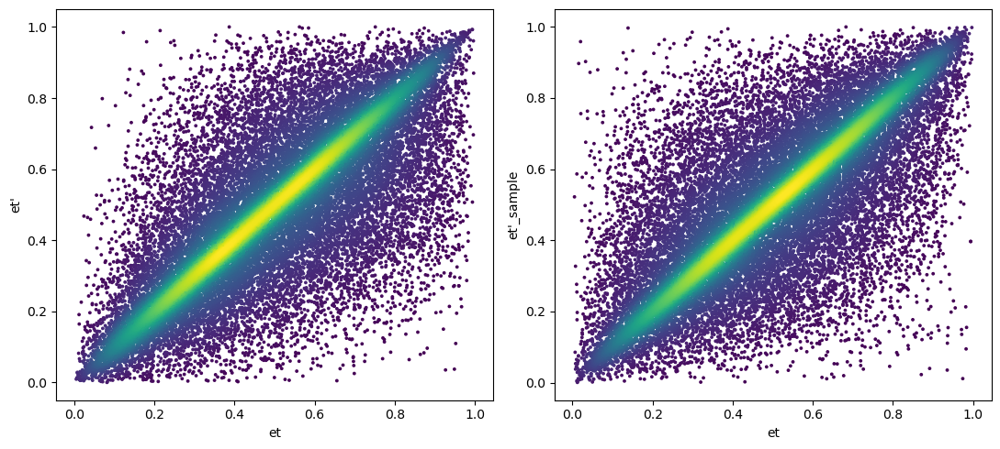

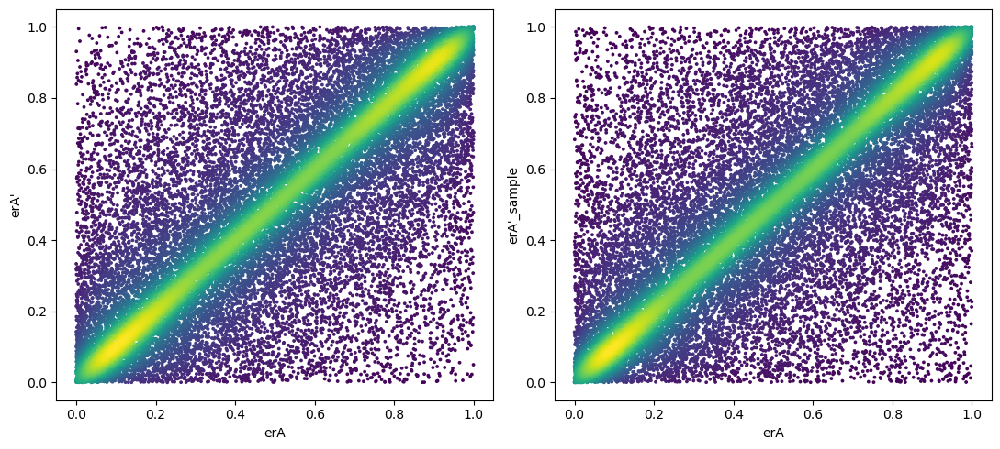

In [11]:
plt.figure(figsize=[11,5])

plt.subplot(1,2,1)
plt.xlabel("et")
plt.ylabel("et'")
dscatter(inv_logit(X_test[:, 1]), inv_logit(Y_test[:, 0]))

plt.subplot(1,2,2)
plt.xlabel("et")
plt.ylabel("et'_sample")
dscatter(inv_logit(X_test[:, 1]), inv_logit(y_test_sample_t))
plt.tight_layout()
plt.show()

plt.figure(figsize=[11,5])

plt.subplot(1,2,1)
plt.xlabel("erA")
plt.ylabel("erA'")
dscatter(inv_logit(X_test[:, 2]), inv_logit(Y_test[:, 1]))

plt.subplot(1,2,2)
plt.xlabel("erA")
plt.ylabel("erA'_sample")
dscatter(inv_logit(X_test[:, 2]), inv_logit(y_test_sample_rA))
plt.tight_layout()
plt.show()

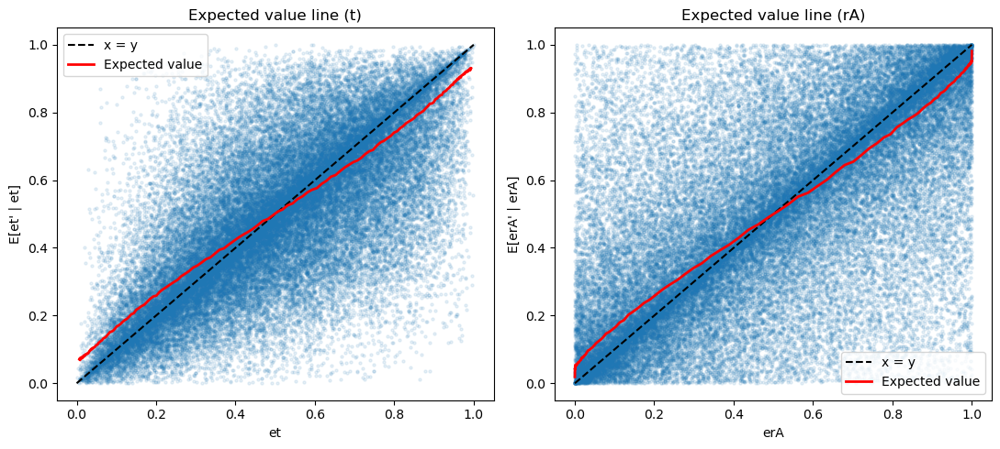

In [12]:
import numpy as np
import matplotlib.pyplot as plt

# Define linear range for input (logit space)
n_points = 200
n_samples = 10_000

x_grid_t = np.linspace(-5, 5, n_points)
x_grid_rA = np.linspace(-10, 10, n_points)

# --- For et ---
# Repeat x_grid_t for each sample
x_input_t = np.tile(x_grid_t, n_samples)

# Sample all at once
y_samples_t = gmm_eps_t.conditional_sample(key, x_input_t)

# Reshape back to (n_points, n_samples)
y_samples_t = y_samples_t.reshape(n_samples, n_points).T

# Compute expected value
expected_t = y_samples_t.mean(axis=1)

# --- For erA ---
x_input_rA = np.tile(x_grid_rA, n_samples)
y_samples_rA = gmm_eps_rA.conditional_sample(key, x_input_rA)
y_samples_rA = y_samples_rA.reshape(n_samples, n_points).T
expected_rA = y_samples_rA.mean(axis=1)

# --- Plot ---
plt.figure(figsize=[11,5])

# et plot
plt.subplot(1,2,1)
plt.xlabel("et")
plt.ylabel("E[et' | et]")
plt.title("Expected value line (t)")
plt.scatter(inv_logit(X_train[:, 1]), inv_logit(Y_train[:, 0]), s=5, alpha=0.1)
plt.plot([0, 1], [0, 1], color='black', linestyle='--', linewidth=1.5, label="x = y")
plt.plot(inv_logit(x_grid_t), inv_logit(expected_t), color='red', lw=2, label="Expected value")
plt.legend()

# erA plot
plt.subplot(1,2,2)
plt.xlabel("erA")
plt.ylabel("E[erA' | erA]")
plt.title("Expected value line (rA)")
plt.scatter(inv_logit(X_train[:, 2]), inv_logit(Y_train[:, 1]), s=5, alpha=0.1)
plt.plot([0, 1], [0, 1], color='black', linestyle='--', linewidth=1.5, label="x = y")
plt.plot(inv_logit(x_grid_rA), inv_logit(expected_rA), color='red', lw=2, label="Expected value")
plt.legend()

plt.tight_layout()
plt.show()

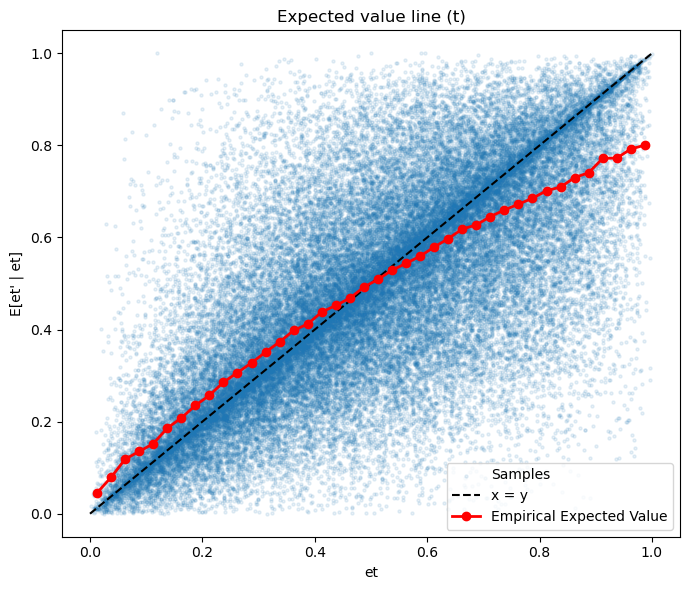

In [13]:
import numpy as np
import matplotlib.pyplot as plt

# Transform variables to [0, 1] space
x_data = inv_logit(X_train[:, 1])
y_data = inv_logit(Y_train[:, 0])

# Define bins for x
n_bins = 40  # adjust for smoothness vs noise
bins = np.linspace(0, 1, n_bins + 1)
bin_centers = 0.5 * (bins[:-1] + bins[1:])

# Digitize input values into bins
indices = np.digitize(x_data, bins) - 1  # bin indices

# Compute average y per bin (empirical E[y'|x])
expected_empirical = np.array([
    y_data[indices == i].mean() if np.any(indices == i) else np.nan
    for i in range(n_bins)
])

# Mask NaN bins for plotting
valid = ~np.isnan(expected_empirical)

# --- Plot ---
plt.figure(figsize=[7,6])
plt.xlabel("et")
plt.ylabel("E[et' | et]")
plt.title("Expected value line (t)")

# Raw data scatter
plt.scatter(x_data, y_data, s=5, alpha=0.1, label="Samples")

# x=y reference
plt.plot([0, 1], [0, 1], color='black', linestyle='--', linewidth=1.5, label="x = y")

# Empirical expected value (binned mean)
plt.plot(bin_centers[valid], expected_empirical[valid], color='red', lw=2, marker='o', label="Empirical Expected Value")

plt.legend()
plt.tight_layout()
plt.show()

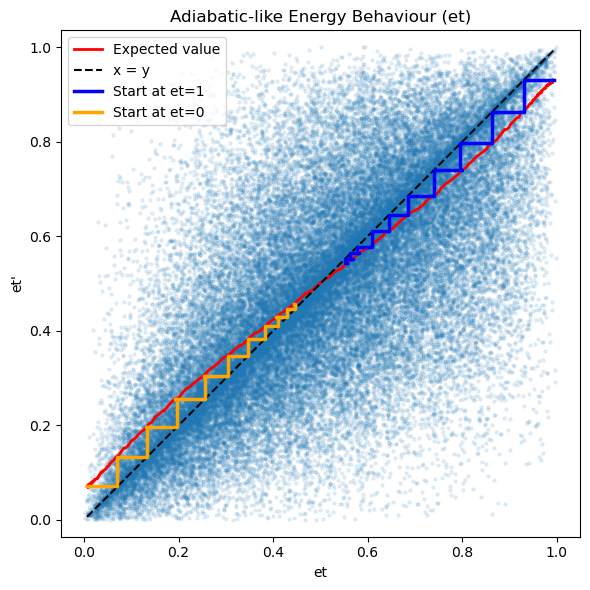

In [14]:
import numpy as np
import matplotlib.pyplot as plt

# Prepare plotting variables
x_vals = inv_logit(x_grid_t)
y_exp = inv_logit(expected_t)
y_identity = x_vals

# Helper to find nearest value on curve
def find_nearest_index(array, value):
    return np.argmin(np.abs(array - value))

def make_bounce_path(x_vals, y_exp, start_x, n_steps=5):
    """
    Create a 'bouncing' step path that alternates horizontally to x=y line 
    and vertically to the expected curve.
    """
    path_x = []
    path_y = []

    # Start at expected line
    i = find_nearest_index(x_vals, start_x)
    x, y = x_vals[i], y_exp[i]

    path_x.append(x)
    path_y.append(y)

    going_to_identity = True

    for _ in range(n_steps):
        if going_to_identity:
            # Horizontal step to x=y line
            y_target = y
            x_target = y_target  # since y=x on the identity line
        else:
            # Vertical step back to expected line
            i_target = find_nearest_index(x_vals, x)
            x_target = x_vals[i_target]
            y_target = y_exp[i_target]

        # Add this segment
        path_x.extend([path_x[-1], x_target])
        path_y.extend([path_y[-1], y_target])

        # Update current point and toggle direction
        x, y = x_target, y_target
        going_to_identity = not going_to_identity

    return path_x, path_y


# Create the two bounce paths
x_step_pos, y_step_pos = make_bounce_path(x_vals, y_exp, start_x=10, n_steps=20)
x_step_neg, y_step_neg = make_bounce_path(x_vals, y_exp, start_x=-10, n_steps=20)

# --- Plot ---
plt.figure(figsize=[6,6])
plt.xlabel("et")
plt.ylabel("et'")
plt.title("Adiabatic-like Energy Behaviour (et)")

# Scatter for reference
plt.scatter(inv_logit(X_train[:, 1]), inv_logit(Y_train[:, 0]), s=5, alpha=0.1)

# Expected and identity lines
plt.plot(x_vals, y_exp, color='red', lw=2, label="Expected value")
plt.plot(x_vals, y_identity, color='black', linestyle='--', lw=1.5, label="x = y")

# Step/bounce paths
plt.plot(x_step_pos, y_step_pos, color='blue', lw=2.5, drawstyle='steps-pre', label="Start at et=1")
plt.plot(x_step_neg, y_step_neg, color='orange', lw=2.5, drawstyle='steps-pre', label="Start at et=0")
plt.xlim(0, 1)
plt.ylim(0, 1)

plt.legend()
plt.axis('equal')
plt.tight_layout()
plt.show()

KL-Divergence for GMM kernel

In [25]:
from scipy.stats import entropy

In [ ]:
y_train_sample_t = gmm_eps_t.conditional_sample(key, X_train[:, 1])
y_train_sample_rA = gmm_eps_rA.conditional_sample(key, X_train[:, 2])

(70000,)

In [100]:
counts, edges = np.histogram(inv_logit(y_train_sample_t), bins=100)
p_t = counts / np.sum(counts)
p_t = np.clip(p_t, 1e-12, 1)
counts, edges = np.histogram(inv_logit(Y_train[:, 0]), bins=100)
p_tr = counts / np.sum(counts)
p_tr = np.clip(p_tr, 1e-12, 1)
KL_t = entropy(p_t, p_tr)
KL_t

np.float64(0.004501462664513139)

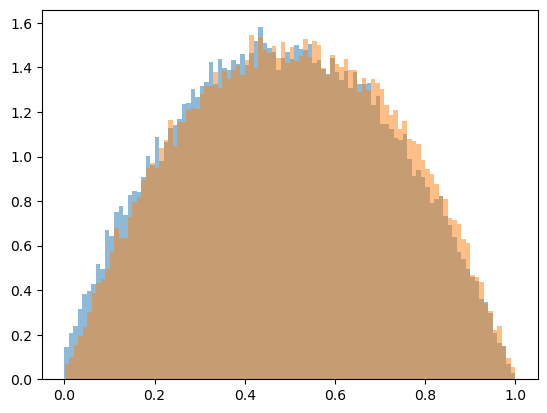

In [115]:
plt.hist(inv_logit(Y_train[:, 0]), bins =100, density= True, alpha= 0.5);
plt.hist(inv_logit(y_train_sample_t), bins = 100, density= True, alpha= 0.5);

In [113]:
counts, edges = np.histogram(inv_logit(y_train_sample_rA), bins=100)
p_r = counts / np.sum(counts)
p_r = np.clip(p_t, 1e-12, 1)
counts, edges = np.histogram(inv_logit(Y_train[:, 1]), bins=100)
p_rr = counts / np.sum(counts)
p_rr = np.clip(p_rr, 1e-12, 1)
KL_r = entropy(p_r, p_rr)
KL_r

np.float64(0.1128351233780046)

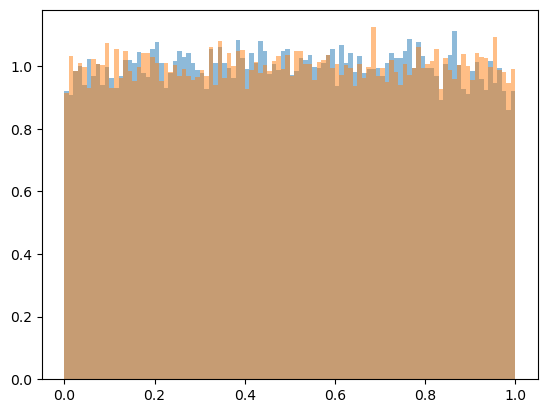

In [ ]:
plt.hist(inv_logit(Y_train[:, 1]), bins = 100, density= True, alpha= 0.5);
plt.hist(inv_logit(y_train_sample_rA), bins = 100, density= True, alpha= 0.5);

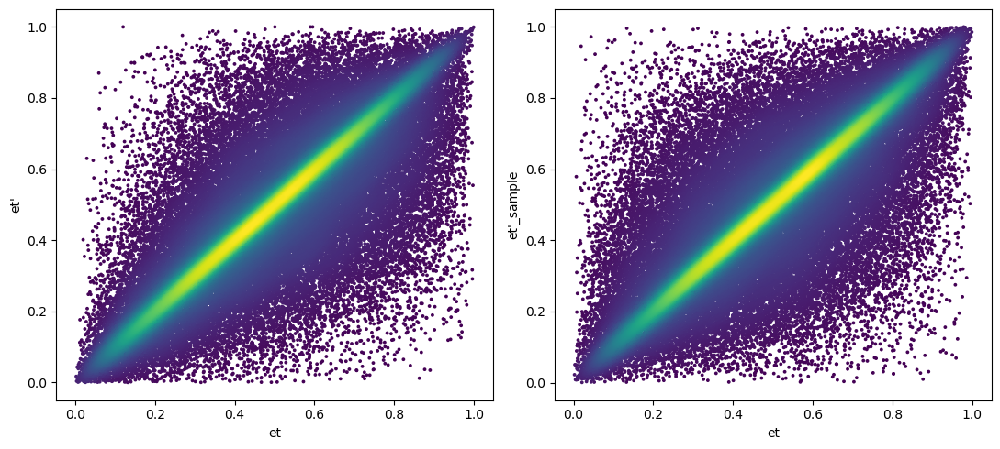

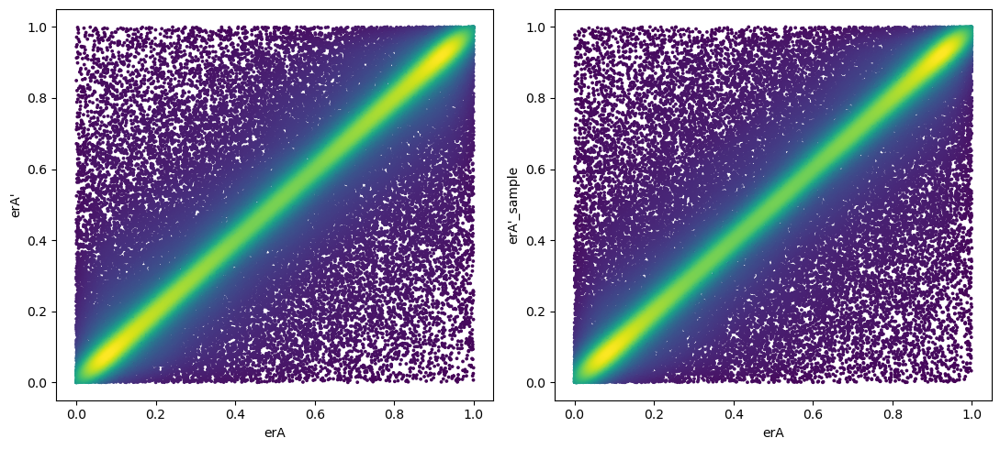

In [ ]:
y_train_sample_t = gmm_eps_t.conditional_sample(key, X_train[:, 1])
y_train_sample_rA = gmm_eps_rA.conditional_sample(key, X_train[:, 2])

plt.figure(figsize=[11,5])

plt.subplot(1,2,1)
plt.xlabel("et")
plt.ylabel("et'")
dscatter(inv_logit(X_train[:, 1]), inv_logit(Y_train[:, 0]))

plt.subplot(1,2,2)
plt.xlabel("et")
plt.ylabel("et'_sample")
dscatter(inv_logit(X_train[:, 1]), inv_logit(y_train_sample_t))
plt.tight_layout()
plt.show()

plt.figure(figsize=[11,5])

plt.subplot(1,2,1)
plt.xlabel("erA")
plt.ylabel("erA'")
dscatter(inv_logit(X_train[:, 2]), inv_logit(Y_train[:, 1]))

plt.subplot(1,2,2)
plt.xlabel("erA")
plt.ylabel("erA'_sample")
dscatter(inv_logit(X_train[:, 2]), inv_logit(y_train_sample_rA))
plt.tight_layout()
plt.show()

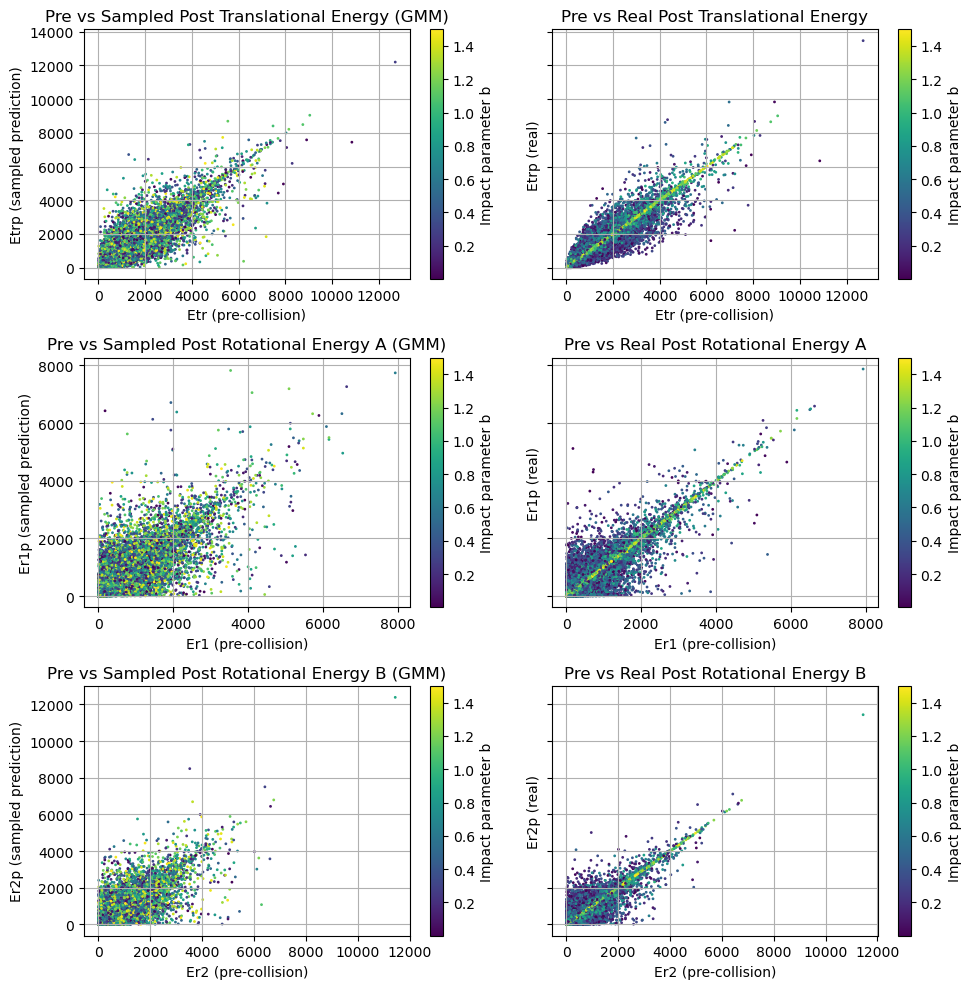

In [16]:
def logit(x):
    x = jnp.clip(x, 1e-6, 1 - 1e-6)
    return jnp.log(x) - jnp.log1p(-x)

def inv_logit(z):
    return jnp.clip(1.0 / (1.0 + jnp.exp(-z)), 1e-12, 1 - 1e-12)

def gmm_sample_conserve(X, Ec, n_samples=1, key=random.PRNGKey(0)):
    """
    Sample post-collision energy fractions from MDN while conserving total energy.
    Returns energies Etr', Er1', Er2' such that sum = Ec always.
    """

    key1, key2 = jax.random.split(key)
    y_test_sample_t = gmm_eps_t.conditional_sample(key1, X[:, 1])
    y_test_sample_rA = gmm_eps_rA.conditional_sample(key2, X[:, 2])
    
    eps_t_p = inv_logit(y_test_sample_t)[:, None]   # Shape: (N, n_samples)
    eps_rA_p = inv_logit(y_test_sample_rA)[:, None] # Shape: (N, n_samples)
    

    Ec_exp = Ec[:, None]  # Shape (N, 1) to allow broadcasting

    # 1. Calculate post-collision translational energy
    Etr_p = eps_t_p * Ec_exp

    # 2. Calculate total post-collision rotational energy
    Erot_p_total = (1.0 - eps_t_p) * Ec_exp

    # 3. Split total rotational energy between molecules A and B
    Er1_p = eps_rA_p * Erot_p_total
    Er2_p = (1.0 - eps_rA_p) * Erot_p_total
    
    return Etr_p, Er1_p, Er2_p

Etrp_samp_test, Er1p_samp_test, Er2p_samp_test = gmm_sample_conserve(X_test, Ec_test, n_samples=1, key=random.PRNGKey(1))

# Make subplots: 3 rows (Etr, Er1, Er2) × 2 cols (Pred vs Real)
fig, axes = plt.subplots(3, 2, figsize=(10, 10), sharey='row',)
fig.subplots_adjust(hspace=0.3, wspace=0.3)

# --- Row 1: Translational energy ---
# Left: predicted
sc0 = axes[0, 0].scatter(data_test["Etr"], Etrp_samp_test, alpha=1, s=1, c=data_test["b"])
axes[0, 0].set_title("Pre vs Sampled Post Translational Energy (GMM)")
axes[0, 0].set_xlabel("Etr (pre-collision)")
axes[0, 0].set_ylabel("Etrp (sampled prediction)")
fig.colorbar(sc0, ax=axes[0, 0], label='Impact parameter b')
axes[0, 0].grid(True)

# Right: real
sc1 = axes[0, 1].scatter(data_test["Etr"], data_test["Etrp"], alpha=1, s=1, c=data_test["b"])
axes[0, 1].set_title("Pre vs Real Post Translational Energy")
axes[0, 1].set_xlabel("Etr (pre-collision)")
axes[0, 1].set_ylabel("Etrp (real)")
fig.colorbar(sc1, ax=axes[0, 1], label='Impact parameter b')
axes[0, 1].grid(True)

# --- Row 2: Rotational Energy A ---
sc2 = axes[1, 0].scatter(data_test["Er1"], Er1p_samp_test, alpha=1, s=1, c=data_test["b"])
axes[1, 0].set_title("Pre vs Sampled Post Rotational Energy A (GMM)")
axes[1, 0].set_xlabel("Er1 (pre-collision)")
axes[1, 0].set_ylabel("Er1p (sampled prediction)")
fig.colorbar(sc2, ax=axes[1, 0], label='Impact parameter b')
axes[1, 0].grid(True)

sc3 = axes[1, 1].scatter(data_test["Er1"], data_test["Er1p"], alpha=1, s=1, c=data_test["b"])
axes[1, 1].set_title("Pre vs Real Post Rotational Energy A")
axes[1, 1].set_xlabel("Er1 (pre-collision)")
axes[1, 1].set_ylabel("Er1p (real)")
fig.colorbar(sc3, ax=axes[1, 1], label='Impact parameter b')
axes[1, 1].grid(True)

# --- Row 3: Rotational Energy B ---
sc4 = axes[2, 0].scatter(data_test["Er2"], Er2p_samp_test, alpha=1, s=1, c=data_test["b"])
axes[2, 0].set_title("Pre vs Sampled Post Rotational Energy B (GMM)")
axes[2, 0].set_xlabel("Er2 (pre-collision)")
axes[2, 0].set_ylabel("Er2p (sampled prediction)")
fig.colorbar(sc4, ax=axes[2, 0], label='Impact parameter b')
axes[2, 0].grid(True)

sc5 = axes[2, 1].scatter(data_test["Er2"], data_test["Er2p"], alpha=1, s=1, c=data_test["b"])
axes[2, 1].set_title("Pre vs Real Post Rotational Energy B")
axes[2, 1].set_xlabel("Er2 (pre-collision)")
axes[2, 1].set_ylabel("Er2p (real)")
fig.colorbar(sc5, ax=axes[2, 1], label='Impact parameter b')
axes[2, 1].grid(True)

plt.tight_layout()
plt.show()

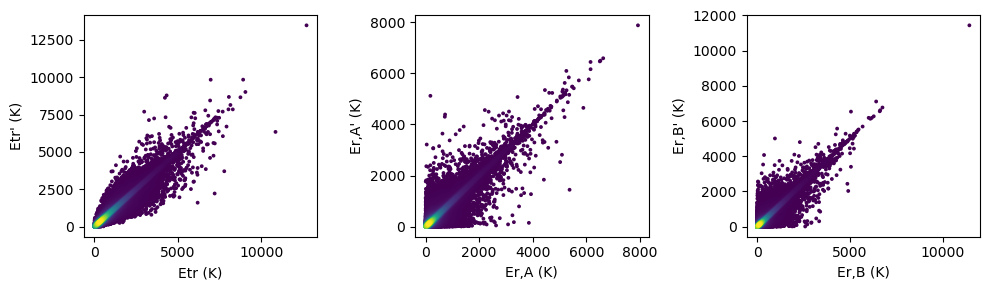

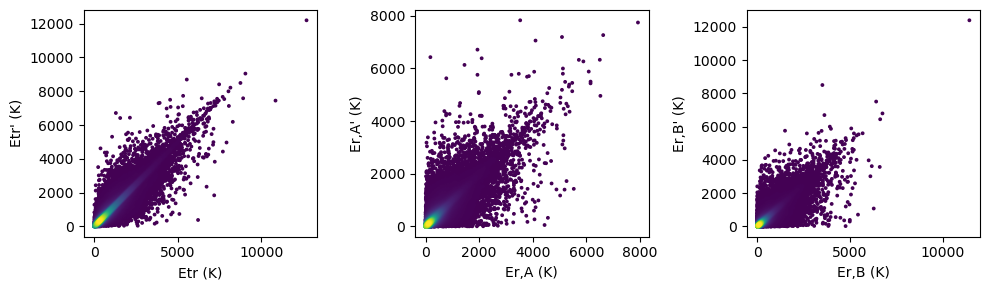

In [17]:
plt.figure(figsize=[10,3])

plt.subplot(1,3,1)
plt.xlabel("Etr (K)")
plt.ylabel("Etr' (K)")
dscatter(data_test['Etr'],data_test['Etrp'])


plt.subplot(1,3,2)
plt.xlabel("Er,A (K)")
plt.ylabel("Er,A' (K)")
dscatter(data_test['Er1'],data_test['Er1p'])


plt.subplot(1,3,3)
plt.xlabel("Er,B (K)")
plt.ylabel("Er,B' (K)")
dscatter(data_test['Er2'],data_test['Er2p'])
plt.tight_layout()
plt.show()

plt.figure(figsize=[10,3])

plt.subplot(1,3,1)
plt.xlabel("Etr (K)")
plt.ylabel("Etr' (K)")
dscatter(data_test['Etr'],Etrp_samp_test.squeeze())


plt.subplot(1,3,2)
plt.xlabel("Er,A (K)")
plt.ylabel("Er,A' (K)")
dscatter(data_test['Er1'],Er1p_samp_test.squeeze())


plt.subplot(1,3,3)
plt.xlabel("Er,B (K)")
plt.ylabel("Er,B' (K)")
dscatter(data_test['Er2'],Er2p_samp_test.squeeze())
plt.tight_layout()
plt.show()

# DSMC - termal equilibrium

In [18]:
params= None

In [19]:
import time
from scipy.stats import maxwell

# ---------------------------
# Physical & simulation params
# ---------------------------
n_particles = 10_000        # increase for better statistics
T0 = 300.0                 # Kelvin (initial equilibrium temperature)
kB = 1.38064852e-23
m_H = 1.6738e-27
m_molecule = 2.0 * m_H     # diatomic identical masses
mu_pair = 0.5 * m_molecule  # reduced mass for identical molecules

# DSMC timestepping
dt = 1e-4
t_end = 0.025 # 0.025 or 0.1
n_steps = int(jnp.ceil(t_end / dt))

snapshot_times = [0.0, 0.013, 0.025, 0.05, 0.75, 0.100]
snapshots = []

# collision candidate batch size per timestep
n_cand = max(200, n_particles // 2)

# PRNG key (JAX)
key = jax.random.PRNGKey(1234)

# ---------------------------
# Utility (same transforms used in training)
# ---------------------------

def preprocess_X_batch_jax(Etr_batch, Er_i_batch, Er_j_batch):
    """
    Vectorized preprocessing for MDN inputs (JAX).
    Inputs arrays shape (Npairs,)
    Returns X_batch (Npairs,3), Ec_batch (Npairs,)
    """
    Ec = Etr_batch + Er_i_batch + Er_j_batch
    E_rot_total = Er_i_batch + Er_j_batch
    eps_t = Etr_batch / (Ec+1e-12)
    eps_r_A = Er_i_batch / (E_rot_total+1e-12)
    # use jnp.log and logit_jnp
    X1 = jnp.log(Ec+1e-12)
    X2 = logit(eps_t)
    X3 = logit(eps_r_A)
    X = jnp.stack([X1, X2, X3], axis=1)
    return X.astype(jnp.float32), Ec

# ---------------------------
# Initialize particles (thermal equilibrium)
# Keep only total rotational energy Er (sum of two mode energies)
# ---------------------------
key, sk = jax.random.split(key)
v_tr = jax.random.normal(sk, (n_particles, 3)) * jnp.sqrt(kB * 33 / m_molecule)

# sample Er_total as Gamma(k=1, scale=kB*T0) using JAX
key, sk = jax.random.split(key)
Er = jax.random.gamma(sk, 1.0, (n_particles,)) * (kB * 700)  # total rotational energy per particle

# convert to numpy for some plotting functions that expect numpy later
v_tr = jnp.array(v_tr)
Er = jnp.array(Er)

# ---------------------------
# Helper: generate disjoint candidate pairs & accept by relative speed (JAX)
# ---------------------------
def select_disjoint_candidates_and_accept(key, v_tr, n_cand):
    """
    Produce disjoint candidate pairs by random permutation:
      - permute indices, take first 2*n_cand indices, reshape to (n_cand,2)
    Accept each pair with probability g/gmax (relative speed weighting).
    Returns:
      key, i_acc (array), j_acc (array), g_acc (array), gmax (scalar)
    """
    N = v_tr.shape[0]
    key, kperm, kune = jax.random.split(key, 3)
    perm = jax.random.permutation(kperm, N)
    # if 2*n_cand > N, reduce n_cand to floor(N/2)
    max_pairs = N // 2
    n_cand_eff = jnp.minimum(n_cand, max_pairs)
    idx2 = perm[:2 * n_cand_eff]
    pairs = idx2.reshape((n_cand_eff, 2))
    i_cand = pairs[:, 0]
    j_cand = pairs[:, 1]
    v_rel = v_tr[i_cand] - v_tr[j_cand]
    g = jnp.linalg.norm(v_rel, axis=1)
    gmax = jnp.maximum(g.max(), 1e-12)
    p = g / gmax
    u = jax.random.uniform(kune, shape=(n_cand_eff,))
    accept_mask = u < p
    i_acc = i_cand[accept_mask]
    j_acc = j_cand[accept_mask]
    g_acc = g[accept_mask]
    return key, i_acc, j_acc, g_acc, gmax

# ---------------------------
# Batch collision processing (JAX vectorized)
# ---------------------------
@jax.jit
def process_pairs_batch_jax(params, key, v_i_arr, v_j_arr, Er_i_arr, Er_j_arr):
    """
    Vectorized processing of accepted disjoint pairs in JAX.
    Inputs: arrays (Npairs, ...) as jnp arrays.
    Returns: v_i_new, v_j_new, Er_i_post, Er_j_post, key
    """
    n_pairs = v_i_arr.shape[0]
    # If zero pairs, return empty arrays quickly
    def zero_return():
        return (jnp.zeros((0, 3)), jnp.zeros((0, 3)), jnp.zeros((0,)), jnp.zeros((0,)), key)

    if n_pairs == 0:
        return zero_return()

    # 1) Compute pair translational energy (relative speed)
    v_rel = v_i_arr - v_j_arr  # (n_pairs,3)
    g2 = jnp.sum(v_rel**2, axis=1)  # (n_pairs,)
    Etr_pair = 0.5 * mu_pair * g2  # (n_pairs,)

    # 2) Preprocess X batch & Ec batch for MDN
    X_batch, Ec_batch = preprocess_X_batch_jax(Etr_pair/kB, Er_i_arr/kB, Er_j_arr/kB)  # shapes (n_pairs,3), (n_pairs,)

    # 3) Call MDN once for whole batch
    # Provide per-batch key for MDN sampling:
    key, kmdn = jax.random.split(key)
    # Etrp_batch, Er_i_post_batch, Er_j_post_batch = mdn_sample_conserve(params, X_batch, Ec_batch, n_samples=1, key=kmdn)
    Etrp_batch, Er_i_post_batch, Er_j_post_batch = gmm_sample_conserve(X_batch, Ec_batch, n_samples=1, key=kmdn)
    # ensure shape (n_pairs,) for each
    Etrp_batch = jnp.squeeze(jnp.array(Etrp_batch)).reshape(-1)*kB
    Er_i_post_batch = jnp.squeeze(jnp.array(Er_i_post_batch)).reshape(-1)*kB
    Er_j_post_batch = jnp.squeeze(jnp.array(Er_j_post_batch)).reshape(-1)*kB

    # jax.debug.print("Etrp_batch: {eb}", eb=(Etr_pair/kB).mean())

    # 4) Reconstruct new velocities:
    # sample isotropic directions via two uniforms per pair
    key, kunif = jax.random.split(key)
    u = jax.random.uniform(kunif, (n_pairs, 2))
    u1 = u[:, 0]; u2 = u[:, 1]
    theta = 2.0 * jnp.pi * u1
    phi = jnp.arccos(2.0 * u2 - 1.0)
    sinphi = jnp.sin(phi)
    dir_new = jnp.stack([sinphi * jnp.cos(theta), sinphi * jnp.sin(theta), jnp.cos(phi)], axis=1)  # (n_pairs,3)

    # g_new and relative velocity
    g_new = jnp.sqrt(jnp.maximum(2.0 * Etrp_batch / mu_pair, 0.0))
    v_rel_new = dir_new * g_new[:, None]  # (n_pairs,3)

    v_cm = 0.5 * (v_i_arr + v_j_arr)
    v_i_new = v_cm + 0.5 * v_rel_new
    v_j_new = v_cm - 0.5 * v_rel_new

    return v_i_new, v_j_new, Er_i_post_batch, Er_j_post_batch, key

# ---------------------------
# Main DSMC loop (Python driver, heavy ops in JAX)
# ---------------------------
t0 = time.time()
times = []
Ttr_list = []
Trot_list = []

# initial temps
T_tr_init = float(jnp.mean(jnp.sum(v_tr**2, axis=1) * m_molecule / (3.0 * kB)))
T_rot_init = float(jnp.mean(Er) / (kB))
print(f"Initial T_tr = {T_tr_init:.3f} K, T_rot = {T_rot_init:.3f} K")

for step in range(n_steps + 1):
    t = step * dt
    # record temps
    T_tr = float(jnp.mean(jnp.sum(v_tr**2, axis=1) * m_molecule / (3.0 * kB)))
    T_rot = float(jnp.mean(Er) / (kB))
    times.append(t)
    Ttr_list.append(T_tr)
    Trot_list.append(T_rot)

    # Save snapshots
    if any(abs(t - st) < dt/2 for st in snapshot_times):
        snapshots.append({
            "time": t,
            "v_tr": np.array(v_tr),
            "Er": np.array(Er),
        })

    if step == n_steps:
        break

    # select disjoint candidate pairs & accept by relative speed (JAX)
    key, i_acc, j_acc, g_acc, gmax = select_disjoint_candidates_and_accept(key, v_tr, n_cand)

    n_acc = i_acc.shape[0]
    if n_acc == 0:
        continue

    print(f"t={t:.4f}s: {n_acc} accepted collisions (gmax={float(gmax):.2e})")

    # gather arrays for accepted pairs (convert to jnp arrays)
    v_i_arr = v_tr[i_acc]
    v_j_arr = v_tr[j_acc]
    Er_i_arr = Er[i_acc]
    Er_j_arr = Er[j_acc]

    # process batch in JAX
    v_i_new_arr, v_j_new_arr, Er_i_new_arr, Er_j_new_arr, key = process_pairs_batch_jax(
        params, key, v_i_arr, v_j_arr, Er_i_arr, Er_j_arr
    )

    # scatter-update (JAX indexed updates)
    v_tr = v_tr.at[i_acc].set(v_i_new_arr)
    v_tr = v_tr.at[j_acc].set(v_j_new_arr)
    Er = Er.at[i_acc].set(Er_i_new_arr)
    Er = Er.at[j_acc].set(Er_j_new_arr)

    print(f"t = {t:.4f} s, T_tr = {T_tr:.3f} K, T_rot = {T_rot:.3f} K")

t1 = time.time()
print(f"Simulation done in {t1 - t0:.2f} s")

Initial T_tr = 32.850 K, T_rot = 702.012 K
t=0.0000s: 1778 accepted collisions (gmax=2.26e+03)
t = 0.0000 s, T_tr = 32.850 K, T_rot = 702.012 K
t=0.0001s: 1024 accepted collisions (gmax=4.94e+03)
t = 0.0001 s, T_tr = 54.539 K, T_rot = 669.479 K
t=0.0002s: 1170 accepted collisions (gmax=4.71e+03)
t = 0.0002 s, T_tr = 65.757 K, T_rot = 652.652 K
t=0.0003s: 1133 accepted collisions (gmax=5.38e+03)
t = 0.0003 s, T_tr = 77.254 K, T_rot = 635.406 K
t=0.0004s: 1104 accepted collisions (gmax=5.84e+03)
t = 0.0004 s, T_tr = 87.306 K, T_rot = 620.328 K
t=0.0005s: 1164 accepted collisions (gmax=5.75e+03)
t = 0.0005 s, T_tr = 98.079 K, T_rot = 604.169 K
t=0.0006s: 1205 accepted collisions (gmax=6.15e+03)
t = 0.0006 s, T_tr = 108.807 K, T_rot = 588.076 K
t=0.0007s: 1185 accepted collisions (gmax=6.45e+03)
t = 0.0007 s, T_tr = 119.008 K, T_rot = 572.775 K
t=0.0008s: 1270 accepted collisions (gmax=6.20e+03)
t = 0.0008 s, T_tr = 128.790 K, T_rot = 558.103 K
t=0.0009s: 1575 accepted collisions (gmax=5.2

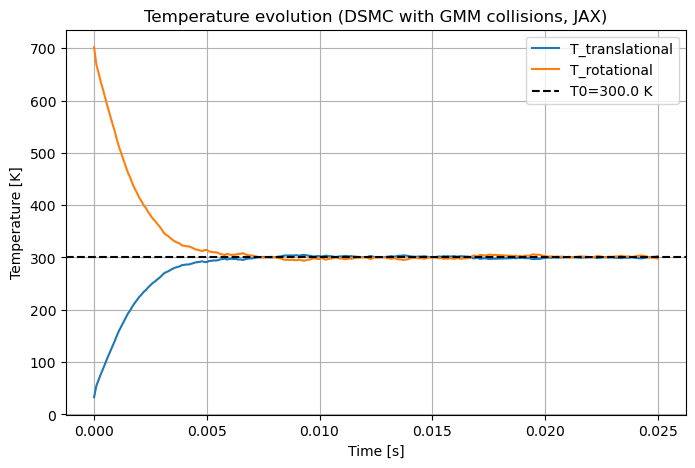

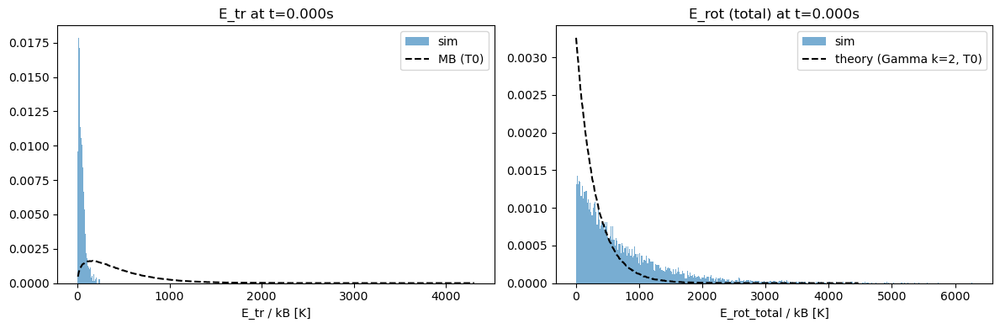

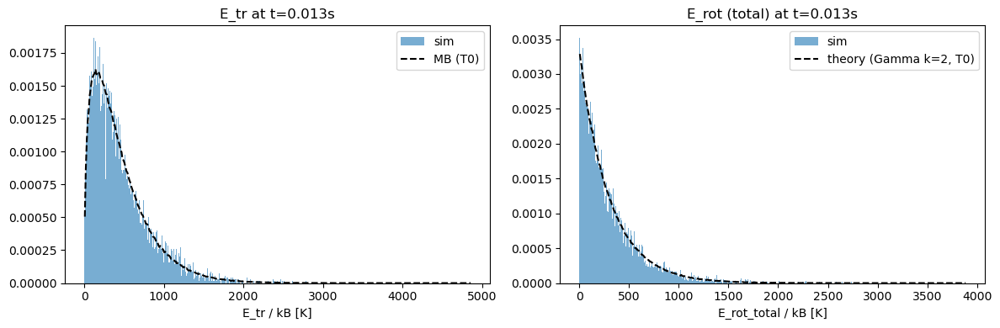

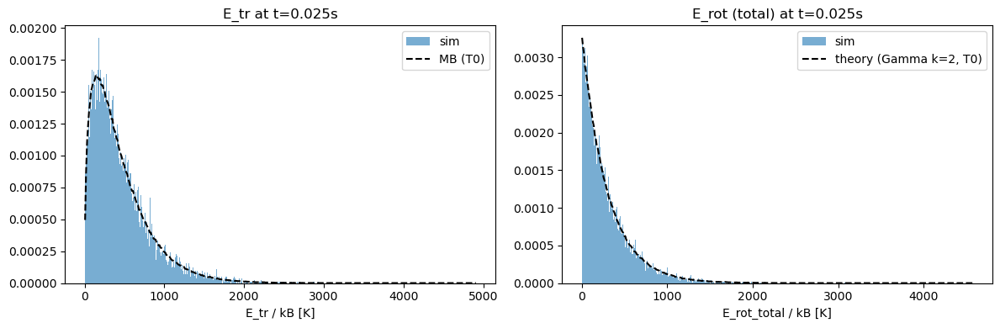

In [20]:

# ---------------------------
# Plot temperatures
# ---------------------------
# T0=500
plt.figure(figsize=(8,5))
plt.plot(times, Ttr_list, label="T_translational")
plt.plot(times, Trot_list, label="T_rotational")
plt.axhline(T0, color="k", linestyle="--", label=f"T0={T0} K")
plt.xlabel("Time [s]")
plt.ylabel("Temperature [K]")
plt.legend()
plt.title("Temperature evolution (DSMC with GMM collisions, JAX)")
plt.grid(True)
plt.show()

# ---------------------------
# Histograms at snapshots
# ---------------------------
def plot_energy_histograms(snapshot):
    t = snapshot["time"]
    v_tr_snap = snapshot["v_tr"]
    Etr_snap = 0.5 * m_molecule * np.sum(v_tr_snap**2, axis=1) / kB  # Kelvin units
    Erot_snap = snapshot["Er"] / kB

    fig, axes = plt.subplots(1, 2, figsize=(12,4))
    # Translational
    ax = axes[0]
    ax.hist(Etr_snap, bins=400, density=True, alpha=0.6, label="sim")
    samp_v = maxwell.rvs(scale=np.sqrt(kB*T0/m_molecule), size=1000000)
    samp_E = 0.5 * m_molecule * samp_v**2 / kB
    hist_s, be = np.histogram(samp_E, bins=400, density=True)
    bc = 0.5*(be[:-1]+be[1:])
    ax.plot(bc, hist_s, 'k--', label="MB (T0)")
    ax.set_xlabel("E_tr / kB [K]")
    ax.set_title(f"E_tr at t={t:.3f}s")
    ax.legend()

    # Rotational
    ax = axes[1]
    ax.hist(Erot_snap, bins=400, density=True, alpha=0.6, label="sim")
    samp_rot = np.random.gamma(shape=1.0, scale=kB*T0, size=1000000) / kB
    hist_s_r, be_r = np.histogram(samp_rot, bins=400, density=True)
    bc_r = 0.5*(be_r[:-1]+be_r[1:])
    ax.plot(bc_r, hist_s_r, 'k--', label="theory (Gamma k=2, T0)")
    ax.set_xlabel("E_rot_total / kB [K]")
    ax.set_title(f"E_rot (total) at t={t:.3f}s")
    ax.legend()

    plt.tight_layout()
    plt.show()

for snap in snapshots:
    plot_energy_histograms(snap)

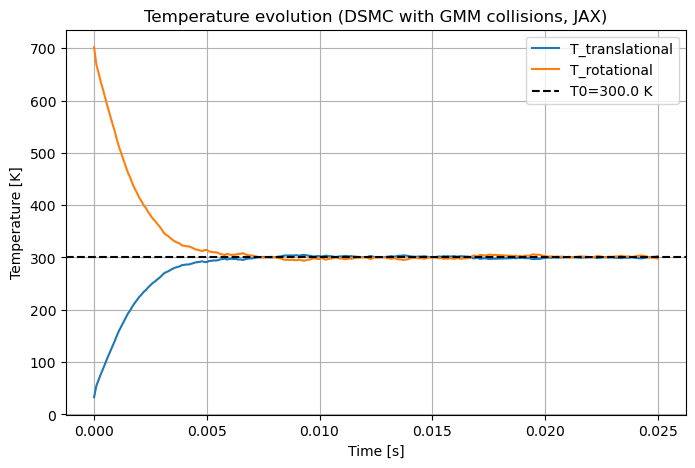

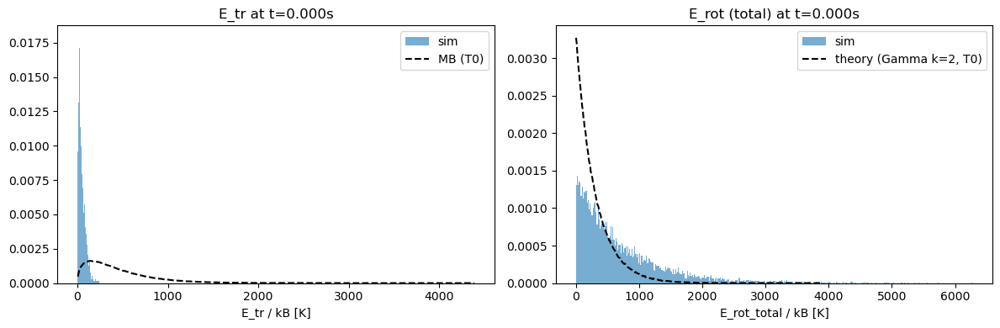

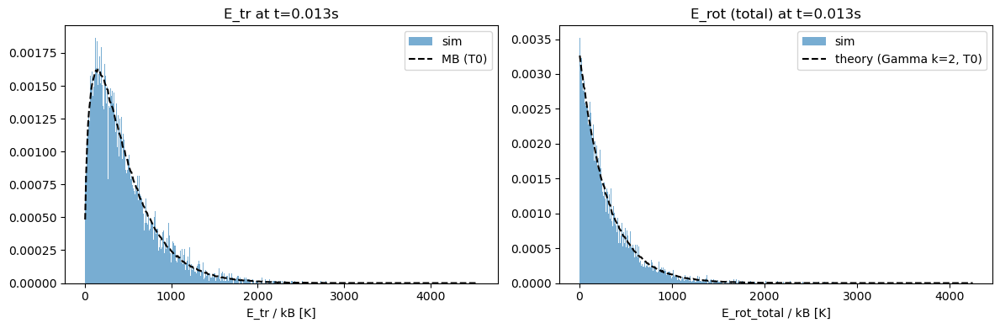

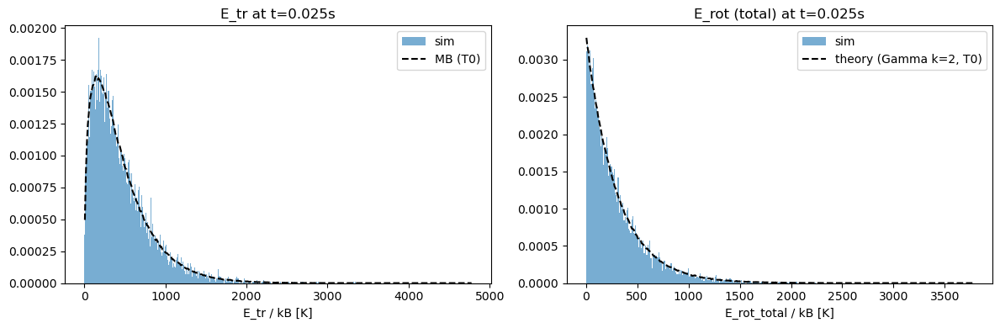

In [21]:

# ---------------------------
# Plot temperatures
# ---------------------------
plt.figure(figsize=(8,5))
plt.plot(times, Ttr_list, label="T_translational")
plt.plot(times, Trot_list, label="T_rotational")
plt.axhline(T0, color="k", linestyle="--", label=f"T0={T0} K")
plt.xlabel("Time [s]")
plt.ylabel("Temperature [K]")
plt.legend()
plt.title("Temperature evolution (DSMC with GMM collisions, JAX)")
plt.grid(True)
plt.show()

# ---------------------------
# Histograms at snapshots
# ---------------------------
def plot_energy_histograms(snapshot):
    t = snapshot["time"]
    v_tr_snap = snapshot["v_tr"]
    Etr_snap = 0.5 * m_molecule * np.sum(v_tr_snap**2, axis=1) / kB  # Kelvin units
    Erot_snap = snapshot["Er"] / kB

    fig, axes = plt.subplots(1, 2, figsize=(12,4))
    # Translational
    ax = axes[0]
    ax.hist(Etr_snap, bins=400, density=True, alpha=0.6, label="sim")
    samp_v = maxwell.rvs(scale=np.sqrt(kB*T0/m_molecule), size=1000000)
    samp_E = 0.5 * m_molecule * samp_v**2 / kB
    hist_s, be = np.histogram(samp_E, bins=400, density=True)
    bc = 0.5*(be[:-1]+be[1:])
    ax.plot(bc, hist_s, 'k--', label="MB (T0)")
    ax.set_xlabel("E_tr / kB [K]")
    ax.set_title(f"E_tr at t={t:.3f}s")
    ax.legend()

    # Rotational
    ax = axes[1]
    ax.hist(Erot_snap, bins=400, density=True, alpha=0.6, label="sim")
    samp_rot = np.random.gamma(shape=1.0, scale=kB*T0, size=1000000) / kB
    hist_s_r, be_r = np.histogram(samp_rot, bins=400, density=True)
    bc_r = 0.5*(be_r[:-1]+be_r[1:])
    ax.plot(bc_r, hist_s_r, 'k--', label="theory (Gamma k=2, T0)")
    ax.set_xlabel("E_rot_total / kB [K]")
    ax.set_title(f"E_rot (total) at t={t:.3f}s")
    ax.legend()

    plt.tight_layout()
    plt.show()

for snap in snapshots:
    plot_energy_histograms(snap)

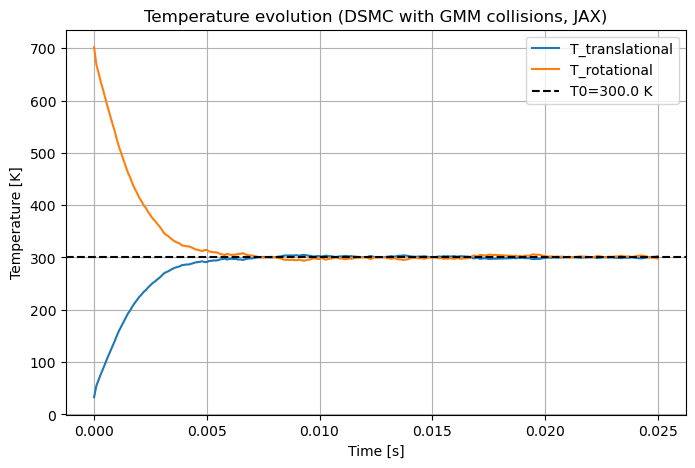

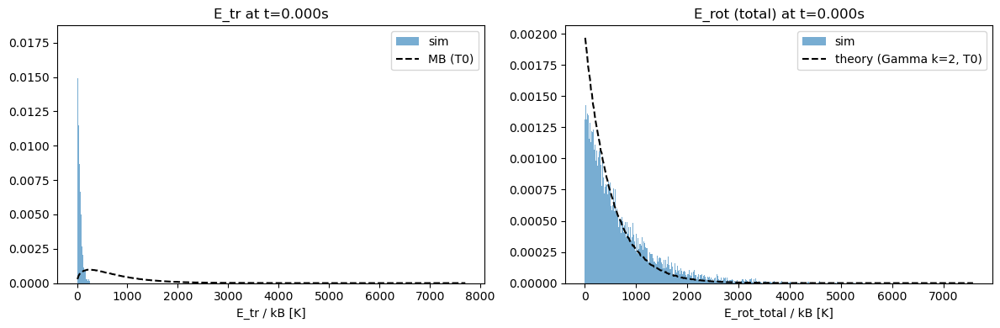

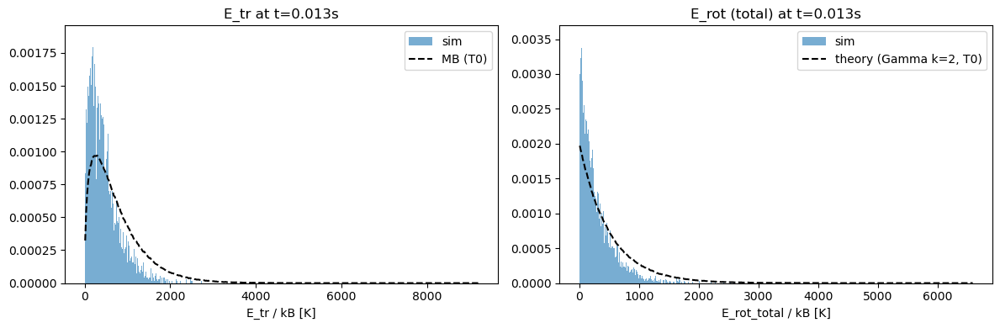

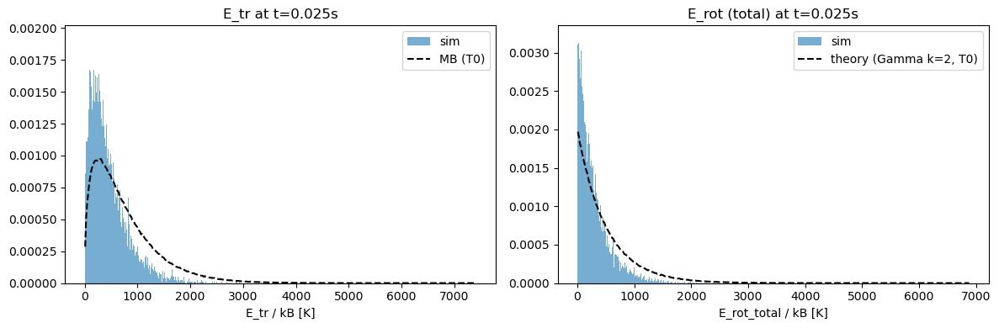

In [22]:

# ---------------------------
# Plot temperatures
# ---------------------------
plt.figure(figsize=(8,5))
plt.plot(times, Ttr_list, label="T_translational")
plt.plot(times, Trot_list, label="T_rotational")
plt.axhline(T0, color="k", linestyle="--", label=f"T0={T0} K")
plt.xlabel("Time [s]")
plt.ylabel("Temperature [K]")
plt.legend()
plt.title("Temperature evolution (DSMC with GMM collisions, JAX)")
plt.grid(True)
plt.show()
T0=500
# ---------------------------
# Histograms at snapshots
# ---------------------------
def plot_energy_histograms(snapshot):
    t = snapshot["time"]
    v_tr_snap = snapshot["v_tr"]
    Etr_snap = 0.5 * m_molecule * np.sum(v_tr_snap**2, axis=1) / kB  # Kelvin units
    Erot_snap = snapshot["Er"] / kB

    fig, axes = plt.subplots(1, 2, figsize=(12,4))
    # Translational
    ax = axes[0]
    ax.hist(Etr_snap, bins=400, density=True, alpha=0.6, label="sim")
    samp_v = maxwell.rvs(scale=np.sqrt(kB*T0/m_molecule), size=1000000)
    samp_E = 0.5 * m_molecule * samp_v**2 / kB
    hist_s, be = np.histogram(samp_E, bins=400, density=True)
    bc = 0.5*(be[:-1]+be[1:])
    ax.plot(bc, hist_s, 'k--', label="MB (T0)")
    ax.set_xlabel("E_tr / kB [K]")
    ax.set_title(f"E_tr at t={t:.3f}s")
    ax.legend()

    # Rotational
    ax = axes[1]
    ax.hist(Erot_snap, bins=400, density=True, alpha=0.6, label="sim")
    samp_rot = np.random.gamma(shape=1.0, scale=kB*T0, size=1000000) / kB
    hist_s_r, be_r = np.histogram(samp_rot, bins=400, density=True)
    bc_r = 0.5*(be_r[:-1]+be_r[1:])
    ax.plot(bc_r, hist_s_r, 'k--', label="theory (Gamma k=2, T0)")
    ax.set_xlabel("E_rot_total / kB [K]")
    ax.set_title(f"E_rot (total) at t={t:.3f}s")
    ax.legend()

    plt.tight_layout()
    plt.show()

for snap in snapshots:
    plot_energy_histograms(snap)

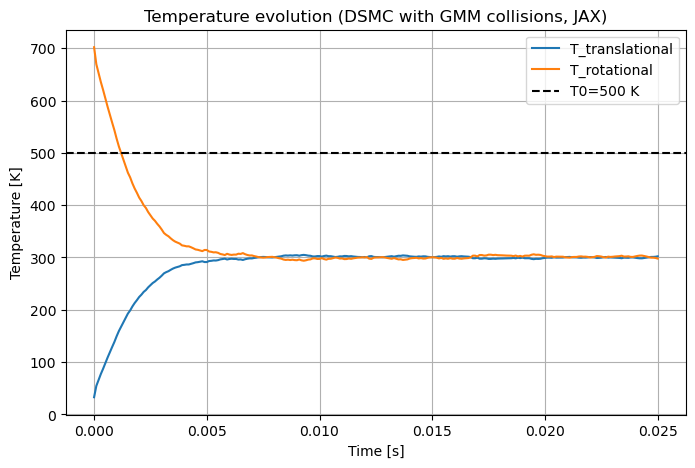

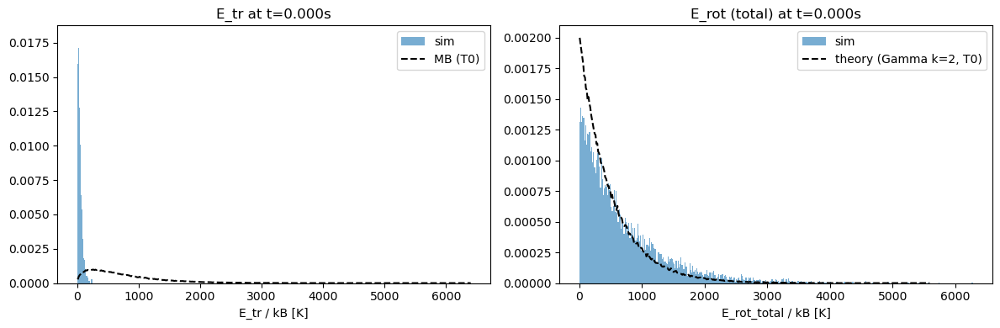

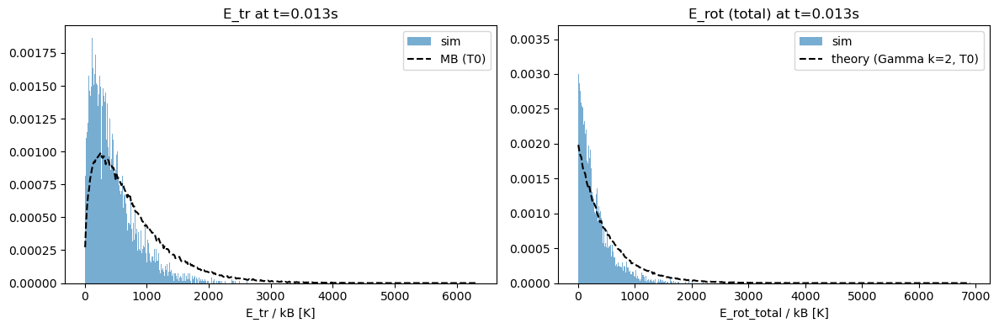

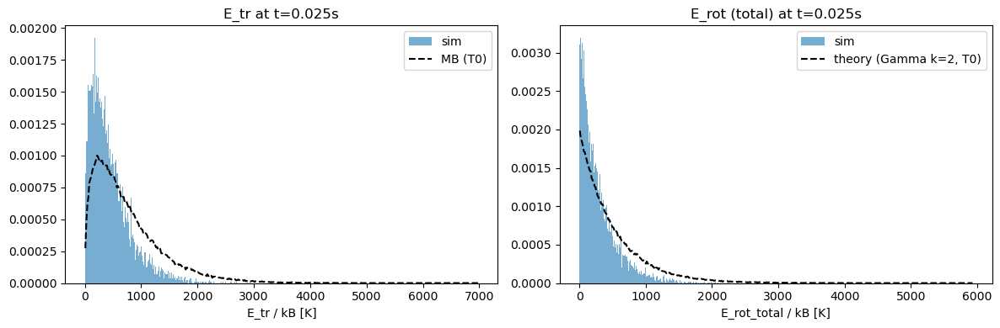

In [23]:

# ---------------------------
# Plot temperatures
# ---------------------------
T0=500
plt.figure(figsize=(8,5))
plt.plot(times, Ttr_list, label="T_translational")
plt.plot(times, Trot_list, label="T_rotational")
plt.axhline(T0, color="k", linestyle="--", label=f"T0={T0} K")
plt.xlabel("Time [s]")
plt.ylabel("Temperature [K]")
plt.legend()
plt.title("Temperature evolution (DSMC with GMM collisions, JAX)")
plt.grid(True)
plt.show()
# ---------------------------
# Histograms at snapshots
# ---------------------------
def plot_energy_histograms(snapshot):
    t = snapshot["time"]
    v_tr_snap = snapshot["v_tr"]
    Etr_snap = 0.5 * m_molecule * np.sum(v_tr_snap**2, axis=1) / kB  # Kelvin units
    Erot_snap = snapshot["Er"] / kB

    fig, axes = plt.subplots(1, 2, figsize=(12,4))
    # Translational
    ax = axes[0]
    ax.hist(Etr_snap, bins=400, density=True, alpha=0.6, label="sim")
    samp_v = maxwell.rvs(scale=np.sqrt(kB*T0/m_molecule), size=200000)
    samp_E = 0.5 * m_molecule * samp_v**2 / kB
    hist_s, be = np.histogram(samp_E, bins=400, density=True)
    bc = 0.5*(be[:-1]+be[1:])
    ax.plot(bc, hist_s, 'k--', label="MB (T0)")
    ax.set_xlabel("E_tr / kB [K]")
    ax.set_title(f"E_tr at t={t:.3f}s")
    ax.legend()

    # Rotational
    ax = axes[1]
    ax.hist(Erot_snap, bins=400, density=True, alpha=0.6, label="sim")
    samp_rot = np.random.gamma(shape=1.0, scale=kB*T0, size=200000) / kB
    hist_s_r, be_r = np.histogram(samp_rot, bins=400, density=True)
    bc_r = 0.5*(be_r[:-1]+be_r[1:])
    ax.plot(bc_r, hist_s_r, 'k--', label="theory (Gamma k=2, T0)")
    ax.set_xlabel("E_rot_total / kB [K]")
    ax.set_title(f"E_rot (total) at t={t:.3f}s")
    ax.legend()

    plt.tight_layout()
    plt.show()

for snap in snapshots:
    plot_energy_histograms(snap)

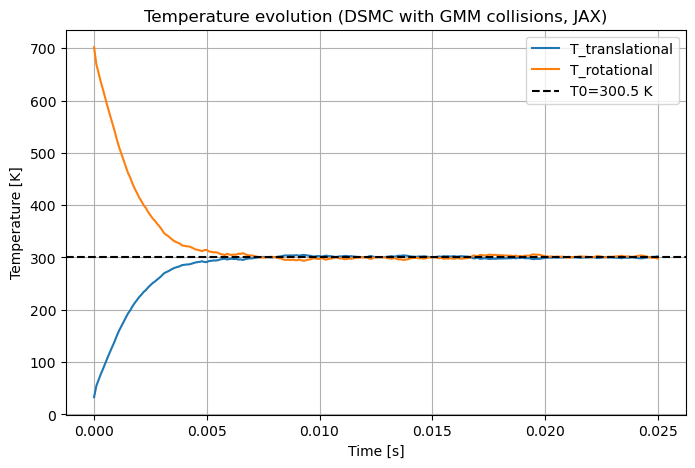

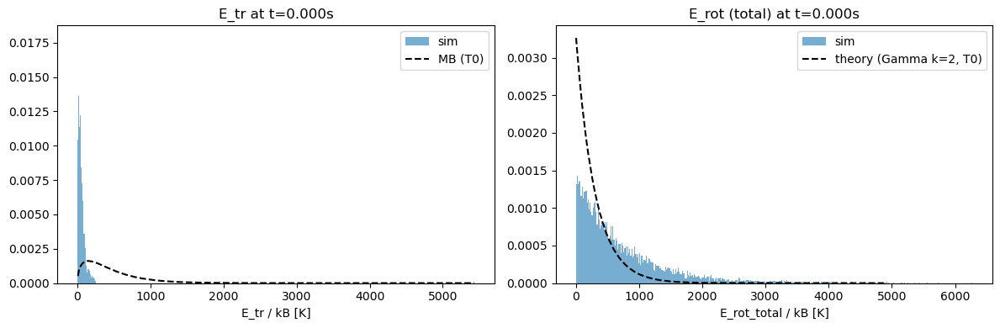

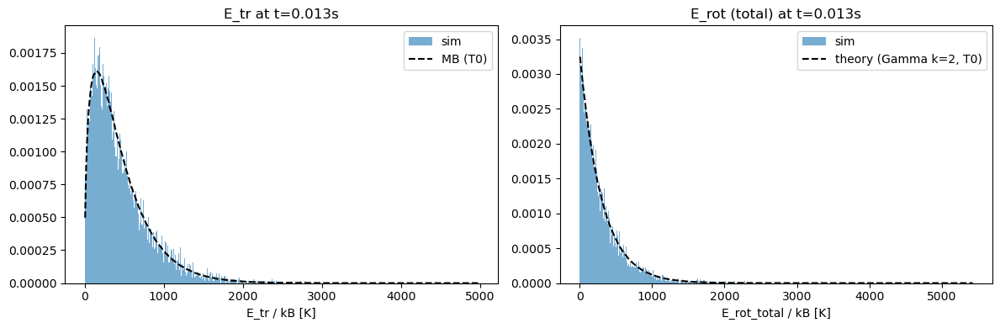

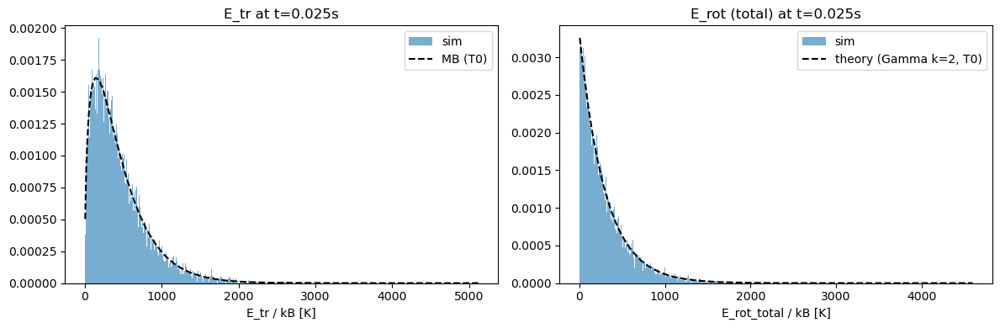

In [24]:
T0=300.5

# ---------------------------
# Plot temperatures
# ---------------------------
plt.figure(figsize=(8,5))
plt.plot(times, Ttr_list, label="T_translational")
plt.plot(times, Trot_list, label="T_rotational")
plt.axhline(T0, color="k", linestyle="--", label=f"T0={T0} K")
plt.xlabel("Time [s]")
plt.ylabel("Temperature [K]")
plt.legend()
plt.title("Temperature evolution (DSMC with GMM collisions, JAX)")
plt.grid(True)
plt.show()

# ---------------------------
# Histograms at snapshots
# ---------------------------
def plot_energy_histograms(snapshot):
    t = snapshot["time"]
    v_tr_snap = snapshot["v_tr"]
    Etr_snap = 0.5 * m_molecule * np.sum(v_tr_snap**2, axis=1) / kB  # Kelvin units
    Erot_snap = snapshot["Er"] / kB

    fig, axes = plt.subplots(1, 2, figsize=(12,4))
    # Translational
    ax = axes[0]
    ax.hist(Etr_snap, bins=400, density=True, alpha=0.6, label="sim")
    samp_v = maxwell.rvs(scale=np.sqrt(kB*T0/m_molecule), size=10000000)
    samp_E = 0.5 * m_molecule * samp_v**2 / kB
    hist_s, be = np.histogram(samp_E, bins=400, density=True)
    bc = 0.5*(be[:-1]+be[1:])
    ax.plot(bc, hist_s, 'k--', label="MB (T0)")
    ax.set_xlabel("E_tr / kB [K]")
    ax.set_title(f"E_tr at t={t:.3f}s")
    ax.legend()

    # Rotational
    ax = axes[1]
    ax.hist(Erot_snap, bins=400, density=True, alpha=0.6, label="sim")
    samp_rot = np.random.gamma(shape=1.0, scale=kB*T0, size=10000000) / kB
    hist_s_r, be_r = np.histogram(samp_rot, bins=400, density=True)
    bc_r = 0.5*(be_r[:-1]+be_r[1:])
    ax.plot(bc_r, hist_s_r, 'k--', label="theory (Gamma k=2, T0)")
    ax.set_xlabel("E_rot_total / kB [K]")
    ax.set_title(f"E_rot (total) at t={t:.3f}s")
    ax.legend()

    plt.tight_layout()
    plt.show()

for snap in snapshots:
    plot_energy_histograms(snap)